In [453]:
import numpy as np
np.float=float
import nibabel
import glob
import os
import sys
import subprocess
import cifti
from brainspace.null_models import MoranRandomization
from brainspace.mesh import mesh_elements as me
#import scipy.io as sio

from scipy import sparse
import pickle
import time
import matplotlib.pyplot as plt
import pandas as pd
import seaborn
import scipy.stats

from scipy.stats import levene
from statsmodels.tools import add_constant
from statsmodels.formula.api import ols ## use formula api to make the tests easier
import matplotlib
from nibabel import cifti2 as ci
import copy
import nipy
#from nipy.modalities.fmri import hrf
#from nipy.modalities.fmri.utils import T, lambdify_t

import seaborn as sns

from scipy.signal import hilbert, chirp

import re
from datetime import date

import nilearn
import nilearn.plotting
import random
from sklearn.metrics import r2_score

In [454]:
from nipy.modalities.fmri import hrf
from nipy.modalities.fmri.utils import T, lambdify_t

# parameters for the database

In [3]:
# subject specific networks

#define network [as np.where(network==x) , x from 1 to 17]

#networks=[nibabel.load(path+'/Evan/CIMT/Subnetworks/'+s+'_precast_infomap_wacky2_subcortreg_ignoreverts/'+s+'_rawassn_minsize10_regularized_allcolumns_recolored.dscalar.nii').dataobj[7][:29696+29716] for s in sub]

networks=[
    nibabel.load(path+'/Evan/MSC/Analysis_V1/infomap/MSC02_infomap_p003_p005_p05/MSC02_rawassn_minsize400_regularized_recolored_cleaned.dscalar.nii').dataobj[0][:29696+29716],
    nibabel.load(path+'/Evan/MSC/Analysis_V1/infomap/MSC06_infomap_p003_p005_p05/MSC06_rawassn_minsize400_regularized_recolored_cleaned.dscalar.nii').dataobj[0][:29696+29716],
    nibabel.load(path+'/Dillan/cast/MSC_analyses/infomap/SIC03_sparse/SIC03_rawassn_minsize100_regularized_recolored_cleaned.dscalar.nii').dataobj[0][:29696+29716]
]


#networks=[np.array([int(i) for i in open(path+'/RosCha/Tools/nifti/MSC02/networks/MSC02_rawassn_minsize400_regularized_recolored_cleaned_values.txt','r').read().split('\n') if i!='']),
#         copy.deepcopy(nibabel.load(path+'/Evan/CIMT/Subnetworks/SIC02_precast_infomap_wacky2_subcortreg_ignoreverts/SIC02_rawassn_minsize10_regularized_recolored_minaud.dtseries.nii').dataobj[0]),#np.array([int(i) for i in open(path+'/RosCha/Tools/nifti/SIC02/SIC02_rawassn_minsize10_regularized_recolored_minaud.dtseriestxt','r').read().split('\n') if i!='']),
#         np.array([int(i) for i in open(path+'/RosCha/Tools/nifti/SIC03/SIC03_rawassn_minsize10_regularized_recolored_222.txt','r').read().split('\n') if i!=''])] 

#maskSNR=cifti.read(path+'/RosCha/Tools/nifti/MSCmean_badverts_cort.dtseries.nii')[0][0]
#for s in range(3):
#    networks[s][np.where(maskSNR!=0)]=13


networkname=['Default','Visual','Fronto-Parietal','PrimaryVisual','DorsalAttention','PreMotor','VentralAttentionLanguage','Salience','Cingulo-Opercular','MotorHand','MotorMouth','Auditory','AntMedialTemporal/SNR noise','PostMedialTemporal','Cingulo-Parietal','Parieto-Occipital','MotorFoot']
networkcolor=[[1,0,0],[0,0,0.6],[0.9,0.9,0],[1,0.7,0.4],[0,0.8,0],[1,0.6,1],[0,0.6,0.6],[0,0,0],[0.3,0,0.6],[0.2,1,1],[1,0.5,0],[0.6,0.2,1],[0,0.2,0.4],[0.2,1,0.2],[0,0,1],[0.85,0.85,0.85],[0,0.5,0]]

In [4]:
#color palette
mypal_net=dict()
for e,m in enumerate(networkname):
    mypal_net.update({m:np.array(networkcolor[e])})
provpal=dict()
provpal.update(mypal_net)


In [5]:
#precast task based
HandDillan=[
    np.array([int(i) for i in open(path+'/RosCha/Tools/nifti/MSC02/motor_spots/DillanMotorHand.txt','r').read().split('\n') if i!='']),
    np.array([int(i) for i in open(path+'/RosCha/Tools/nifti/SIC02/DillanMotorHand.txt','r').read().split('\n') if i!='']),
    np.array([int(i) for i in open(path+'/RosCha/Tools/nifti/SIC03/DillanMotorHand.txt','r').read().split('\n') if i!=''])
]
HandDillan[0][np.where(HandDillan[0]>6)]=0
HandDillan[1][np.where(HandDillan[1]>6)]=0
HandDillan[2][np.where(HandDillan[2]>6)]=0
HandDillanname=['L_M1','R_M1','L_sma','R_sma','Ltemp','Rtemp']

In [6]:
sub = ['SIC01','SIC02','SIC03']
# load task results from each subjects
#not needed

#taskname = ['motor','motordigit','armlocalizer','imaginedmotor', 'handlocalizer','imaginedmotor_vs_motor']

#secondlevel = ['precast_vs_postcast','precast_vs_postcast','all','all','all','all-imaginedmotor_vs_precast-motor']

In [7]:
# time plot pre post
#load the list of vc pre post : 
pplist=[[] for s in range(len(sub))]
for e,s in enumerate(sub):
    pplist[e]=[[i for i in open(path+'/RosCha/Data/Precision/motor/'+s+'/conditionlist/'+p+'cast.txt','r').read().split('\n') if i!=''] for p in ['pre','post']]+[[i for i in open(path+'/RosCha/Data/Precision/rest/'+s+'/conditionlist/during.txt','r').read().split('\n') if i!='']]
    for j in range(3):
        pplistorder=np.argsort([int(i.replace('vc','').replace('_motor','').replace('_rest_','')) for i in pplist[e][j]])
        if e==0 and j==2:
            pplistorder=np.concatenate([pplistorder[4:6],pplistorder[:4],pplistorder[6:]],0)
        pplist[e][j]=[pplist[e][j][i] for i in pplistorder]
    

In [8]:
datelist=[[] for s in range(len(sub))]
for e,s in enumerate(sub):
    datelist[e]=[i.split('_') for i in open(path+'/RosCha/Data/Precision/eventfiles/castsessions/'+s+'_session_date.txt','r').read().split('\n') if i!='']

# VIm coordinate

In [ ]:
import numpy as np
import nibabel
#format adaptation 
#to make short 
test=nibabel.load(path+'/RosCha/Structurals/cast/ACPC/SIC03/SIC03_mpr_debias_avgT.nii')
data = test.get_fdata().astype(np.ubyte)
test= nibabel.Nifti1Image(data, header=test.header, affine=test.affine)        
test.header.set_data_dtype(np.uint16)                    
nibabel.save(test, path+'/RosCha/Structurals/cast/ACPC/SIC03/SIC03_mpr_debias_avgT_short.nii')  


test=nibabel.load(path+'/RosCha/Structurals/cast/ACPC/SIC02/SIC02_mpr_debias_avgT.nii')
data = test.get_fdata().astype(np.uint16)
test= nibabel.Nifti1Image(data, header=test.header, affine=test.affine)        
test.header.set_data_dtype(np.uint16)                    
nibabel.save(test, path+'/RosCha/Structurals/cast/ACPC/SIC02/SIC02_mpr_debias_avgT_short.nii')  



test=nibabel.load(path+'/RosCha/Structurals/cast/ACPC/SIC01/SIC01_mpr_debias_avgT.nii')
data = test.get_fdata().astype(np.uint16)
test= nibabel.Nifti1Image(data, header=test.header, affine=test.affine)        
test.header.set_data_dtype(np.uint16)                    
nibabel.save(test, path+'/RosCha/Structurals/cast/ACPC/SIC01/SIC01_mpr_debias_avgT_short.nii')  


In [233]:

#then run nitrc (after adding ARTHOME in my bashrc)
#cd /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC03
#/data/nil-bluearc/GMT/RosCha/Tools/nitrc/bin/acpcdetect -i SIC03_mpr_debias_avgT_short.nii

#bring ventricule freesurfer to RAS. in aseg third ventricule is 14
#first need to go from mgz to nii
#mri_convert -rt nearest -rl /data/nil-bluearc/GMT/Dillan/preproc_2018-07-03/SIC03/T1/SIC03_mpr_debias_avgT.nii.gz /data/nil-bluearc/GMT/Dillan/preproc_2018-07-03/SIC03/fs5.3_native_default/SIC03/mri/aparc.a2009s+aseg.mgz /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC03/aparc.a2009s+aseg_1mm.nii

#load remove anything not 14 save
d=path+'/RosCha/Structurals/cast/ACPC/SIC03/aparc.a2009s+aseg_1mm.nii'
test=nibabel.load(d)
data=test.get_fdata()
data[np.where(data!=14)]=0
test= nibabel.Nifti1Image(data, header=test.header, affine=test.affine)        
test.header.set_data_dtype(np.uint16)                    
nibabel.save(test, d.replace('.nii','_3rdvent.nii'))  

d=d.replace('.nii','_3rdvent.nii')
subprocess.call(['applywarp','--rel','--interp=nn','-i',d,'-r',path+'/Dillan/preproc_2018-07-03/SIC03/T1/SIC03_mpr_debias_avgT.nii.gz','-w',path+'/RosCha/Structurals/cast/TRIO/SIC03/zero.nii.gz','-o',path+'/RosCha/Structurals/cast/ACPC/SIC03/aparc.a2009s+aseg.nii'])
#then to RAS orientation
subprocess.call(['flirt','-in',path+'/RosCha/Structurals/cast/ACPC/SIC03/aparc.a2009s+aseg.nii','-ref',path+'/RosCha/Structurals/cast/ACPC/SIC03/SIC03_mpr_debias_avgT_short.nii','-out',path+'/RosCha/Structurals/cast/ACPC/SIC03/aparc.a2009s+aseg_RAS.nii','-init',path+'/RosCha/Structurals/cast/ACPC/SIC03/SIC03_mpr_debias_avgT_short_FSL.mat','-applyxfm'])


#cd /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC02
#/data/nil-bluearc/GMT/RosCha/Tools/nitrc/bin/acpcdetect -i SIC02_mpr_debias_avgT_short.nii
#mri_convert -rt nearest -rl /data/nil-bluearc/GMT/Dillan/preproc_2018-07-03/SIC02/T1/SIC02_mpr_debias_avgT.nii.gz /data/nil-bluearc/GMT/Dillan/preproc_2018-07-03/SIC02/fs5.3_native_default/SIC02/mri/aparc.a2009s+aseg.mgz /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC02/aparc.a2009s+aseg_1mm.nii
d=path+'/RosCha/Structurals/cast/ACPC/SIC02/aparc.a2009s+aseg_1mm.nii'
test=nibabel.load(d)
data=test.get_fdata()
data[np.where(data!=14)]=0
test= nibabel.Nifti1Image(data, header=test.header, affine=test.affine)        
test.header.set_data_dtype(np.uint16)                    
nibabel.save(test, d.replace('.nii','_3rdvent.nii'))  
d=d.replace('.nii','_3rdvent.nii')
subprocess.call(['applywarp','--rel','--interp=nn','-i',d,'-r',path+'/Dillan/preproc_2018-07-03/SIC02/T1/SIC02_mpr_debias_avgT.nii.gz','-w',path+'/RosCha/Structurals/cast/TRIO/SIC02/zero.nii.gz','-o',path+'/RosCha/Structurals/cast/ACPC/SIC02/aparc.a2009s+aseg.nii'])
subprocess.call(['flirt','-in',path+'/RosCha/Structurals/cast/ACPC/SIC02/aparc.a2009s+aseg.nii','-ref',path+'/RosCha/Structurals/cast/ACPC/SIC02/SIC02_mpr_debias_avgT_short.nii','-out',path+'/RosCha/Structurals/cast/ACPC/SIC02/aparc.a2009s+aseg_RAS.nii','-init',path+'/RosCha/Structurals/cast/ACPC/SIC02/SIC02_mpr_debias_avgT_short_FSL.mat','-applyxfm'])

######applywarp --rel --interp=nn -i /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC02/aparc.a2009s+aseg_1mm.nii -r /data/nil-bluearc/GMT/Dillan/preproc_2018-07-03/SIC02/T1/SIC02_mpr_debias_avgT.nii.gz -w /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/TRIO/SIC02/zero.nii.gz -o /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC02/aparc.a2009s+aseg.nii
#####flirt -in /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC02/aparc.a2009s+aseg.nii -ref SIC02_mpr_debias_avgT_short.nii -out /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC02/aparc.a2009s+aseg_RAS.nii -init SIC02_mpr_debias_avgT_short_FSL.mat -applyxfm

#cd /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC01
#/data/nil-bluearc/GMT/RosCha/Tools/nitrc/bin/acpcdetect -i SIC01_mpr_debias_avgT_short.nii
#mri_convert -rt nearest -rl /data/nil-bluearc/GMT/Dillan/preproc_2018-07-03/SIC01/T1/SIC01_mpr_debias_avgT.nii.gz /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/fs5.3_native/MSC02/mri/aparc.a2009s+aseg.mgz /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC01/aparc.a2009s+aseg_1mm.nii
d=path+'/RosCha/Structurals/cast/ACPC/SIC01/aparc.a2009s+aseg_1mm.nii'
test=nibabel.load(d)
data=test.get_fdata()
data[np.where(data!=14)]=0
test= nibabel.Nifti1Image(data, header=test.header, affine=test.affine)        
test.header.set_data_dtype(np.uint16)                    
nibabel.save(test, d.replace('.nii','_3rdvent.nii'))  
d=d.replace('.nii','_3rdvent.nii')
subprocess.call(['applywarp','--rel','--interp=nn','-i',d,'-r',path+'/Dillan/preproc_2018-07-03/SIC01/T1/SIC01_mpr_debias_avgT.nii.gz','-w',path+'/RosCha/Structurals/cast/TRIO/SIC01/zero.nii.gz','-o',path+'/RosCha/Structurals/cast/ACPC/SIC01/aparc.a2009s+aseg.nii'])
subprocess.call(['flirt','-in',path+'/RosCha/Structurals/cast/ACPC/SIC01/aparc.a2009s+aseg.nii','-ref',path+'/RosCha/Structurals/cast/ACPC/SIC01/SIC01_mpr_debias_avgT_short.nii','-out',path+'/RosCha/Structurals/cast/ACPC/SIC01/aparc.a2009s+aseg_RAS.nii','-init',path+'/RosCha/Structurals/cast/ACPC/SIC01/SIC01_mpr_debias_avgT_short_FSL.mat','-applyxfm'])

#######applywarp --rel --interp=nn -i /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC01/aparc.a2009s+aseg_1mm.nii -r /data/nil-bluearc/GMT/Dillan/preproc_2018-07-03/SIC01/T1/SIC01_mpr_debias_avgT.nii.gz -w /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/TRIO/SIC01/zero.nii.gz -o /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC01/aparc.a2009s+aseg.nii
########flirt -in /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC01/aparc.a2009s+aseg.nii -ref SIC01_mpr_debias_avgT_short.nii -out /net/10.20.145.45/DOSENBACH03/GMT3/RosCha/Structurals/cast/ACPC/SIC01/aparc.a2009s+aseg_RAS.nii -init SIC01_mpr_debias_avgT_short_FSL.mat -applyxfm



0

In [268]:
import nibabel
import numpy as np
datapath=[path+'/RosCha/Structurals/cast/ACPC/'+s+'/aparc.a2009s+aseg_RAS.nii.gz' for s in ['SIC01','SIC02','SIC03']]
for d in datapath:
    test=nibabel.load(d)
    data=test.get_fdata()
    #so we are in 1mm isovoxel
    #go to 0 mni slices
    affine=test.affine
    x, y, z, _ =np.round(-affine.T[3]/np.diag(affine))
    #we want z
    data0=(np.array(data.T)[[int(z)-1,int(z),int(z)+1]]).T
    #select only values 14 ,  the transform smooth around voxels
    val=np.where(data0!=0)
    #then get min max of Y
    vmax,vmin=np.max(val[1]),np.min(val[1])
    print(vmax)
    #1/4 from the max as positive is back of head
    newy=vmin+(vmax-vmin)/4
    
    #then select this slice and get min max of X
    #14mm (voxels here) from middle or 11 from side left (negative) or right (positive)
    
    vmax,vmin=np.max(val[0]),np.min(val[0])
    #L11, L14, R11, R14
    newxL=np.sort(([(vmax+vmin)/2-14/np.diag(affine)[0],vmin-11/np.diag(affine)[0]]))#-x
    newxR=np.sort(([vmax+11/np.diag(affine)[0],(vmax+vmin)/2+14/np.diag(affine)[0]]))#-x
    #then one or 3 mm up
    newz=np.sort(([z,z+3/np.diag(affine)[2]]))#-z #stay, 1 or 3 up
    newy=np.sort(([newy+2/np.diag(affine)[1],newy]))#-y #stay, 1 or 2 anterior

    datasave=np.zeros(data.shape)
    for x0 in range(int(np.floor(newxL[0])),int(np.ceil(newxL[1]))+1):
        for y0 in range(int(np.floor(newy[0])),int(np.ceil(newy[1]))+1):
            for z0 in range(int(np.floor(newz[0])),int(np.ceil(newz[1]))+1):
                datasave[int(x0),int(y0),int(z0)]=1
                
    for x0 in range(int(np.floor(newxR[0])),int(np.ceil(newxR[1]))+1):
        
        for y0 in range(int(np.floor(newy[0])),int(np.ceil(newy[1]))+1):
        
            for z0 in range(int(np.floor(newz[0])),int(np.ceil(newz[1]))+1):
        
                datasave[int(x0),int(y0),int(z0)]=1
        
    test= nibabel.Nifti1Image(datasave, header=test.header, affine=test.affine)        
    test.header.set_data_dtype(np.uint16)                    
    nibabel.save(test, d.replace('.nii.gz','_VIMmarkers.nii.gz'))  



166


[-15 -14 -13 -12 -11 -10  -8  -6  -4  -2   2   4   6   8  10  11  12  13
  14  15] 4


/tmp/ipykernel_144630/3746687299.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_144630/3746687299.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_144630/3746687299.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays.py:786: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2794: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


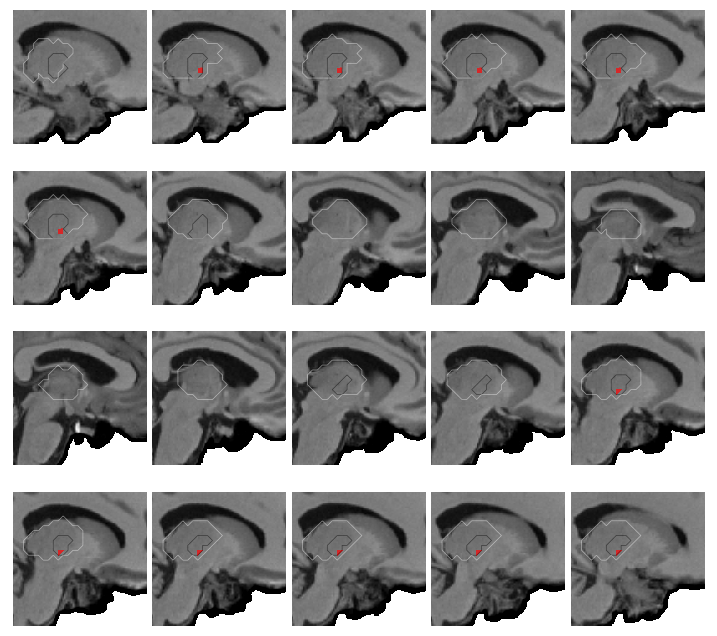

[-15 -14 -13 -12 -11 -10  -8  -6  -4  -2   2   4   6   8  10  11  12  13
  14  15] 4


/tmp/ipykernel_144630/3746687299.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_144630/3746687299.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_144630/3746687299.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays.py:786: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2794: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


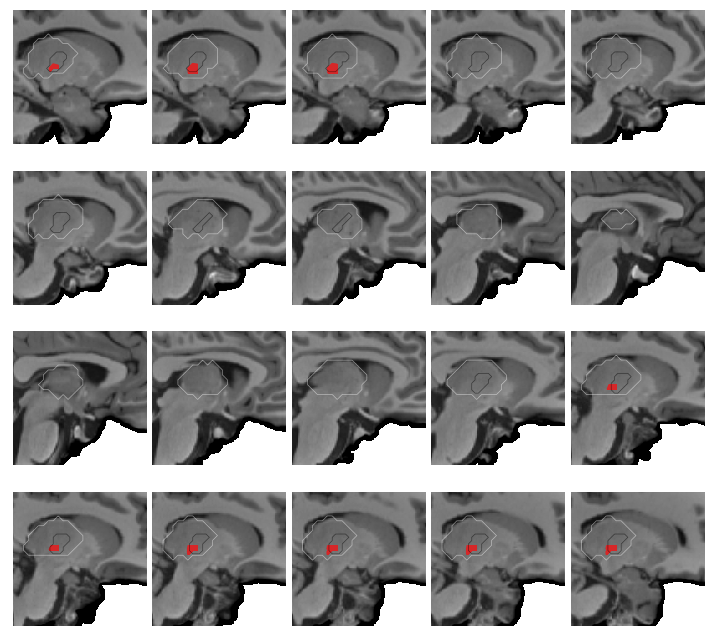

[-15 -14 -13 -12 -11 -10  -8  -6  -4  -2   2   4   6   8  10  11  12  13
  14  15] 4


/tmp/ipykernel_144630/3746687299.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_144630/3746687299.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_144630/3746687299.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays.py:786: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2794: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


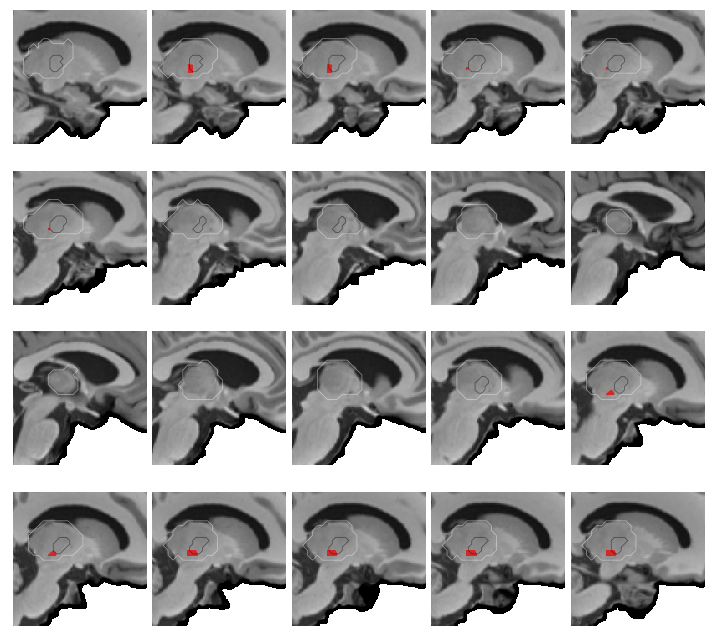

In [307]:


##HERE2806
black=np.array([0,0,0])
white=np.array([1,1,1])
##HERE0108
#T1path=[path+'/croninj/SIC01/T1/SIC01_mpr_debias_avgT_111_t88.nii.gz',path+'/croninj/SIC02/T1/SIC02_mpr_debias_avgT_111_t88.nii.gz',path+'/Dillan/preproc_2018-07-03/SIC03/T1/SIC03_mpr_debias_avgT_111_t88.nii.gz']
T1path=[path+'/RosCha/Structurals/cast/bet/'+s+'/T1_masked.nii.gz' for s in sub]

sideval=[1,-1]
for e,s in enumerate(sub):#just changing the scaling of the thalamus
    basefile=path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel'
    for side2,side in enumerate(['L']):#,'R']):
        
        pathorig=path+'/RosCha/Structurals/cast/ACPC/'+s+'/aparc.a2009s+aseg_WIMmarkers_trio_333.dtseries.nii'
        #for coloring np.concatenate([np.array(netspotcolorMOD)[np.array([10,11,17,18])],[(244/255., 231/255., 102/255.)]],0)
        #1 fc blue, 2 task red, 3 both yellow :[(102/255., 143/255., 244/255.),(244/255., 102/255., 143/255.),(244/255., 231/255., 102/255.)]

        
        flatui=[[0.45364210443800146, 0.26235001796898216, 0.4572502050039957],sns.color_palette('tab20')[6],sns.color_palette('tab20')[7]]#[(0.3,0.3,1),(1,0.3,0.3),(0.9,0.9,0.3)]#[(102/255./2+0.5, 143/255./2+0.5, 244/255./2+0.5),(244/255./2+0.5, 102/255./2+0.5, 143/255./2+0.5),(244/255./2+0.5, 231/255./2+0.5, 102/255./2+0.5)]

        mycmap = get_continuous_cmap(sns.color_palette(np.concatenate([flatui[::-1],[white],flatui],0)).as_hex(),N=5)
        color_listpos = np.array([flatui[1]])#[(mycmap(i)) for i in range(25,50)]#[::-1]
        #color_listneg = [(mycmap(i)) for i in np.arange(24,-1,-1)]#[::-1]
        lim=[0,1]#limmaxall[e]]
        limpos=np.array([0.05])#np.arange(1,4)-0.1#np.concatenate([[lim[0]],[(lim[1]-lim[0])*(i+1)/24+lim[0] for i in range(24)]],0)
        #lim=[-limmaxall[e],0]
        #limneg=limpos

        provlab=np.array([17,4] )
        net=path+'/RosCha/Structurals/cast/THOMAS/'+s+'thomasfull_castshape_222.nii.gz'#path+'/RosCha/Structurals/cast/TRIO/'+s+'/ThalamicNuclei.v12.T1_on_TRIO_Y_NDC_222_BIN.nii.gz'
        if e==0:
            net=net.replace('222','333')
        plotvolindivThalamT1(pathorig,net,T1path[e],segselect=provlab,ortho='x',colorpos=color_listpos,thresholdpos=limpos,Zannotate=False,savefig=path+'/RosCha/Results/figures/plasticitypulses/vol_thalamus_'+s+'_VIM.pdf',smoothing=0,dilation=0)#dilation=1)#scale=5,space=None)colorneg=color_listneg,thresholdneg=limneg,
        
        

# overlap and similarity

In [630]:
#peak for fc change
        
        
        
        

##HERE2806
sideval=[1,-1]
#e=1
#s=sub[e]
for e,s in enumerate(sub):#just changing the scaling of the thalamus
    for side2,side in enumerate(['L']):#,'R']):
        basefile=path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel'
    

        pathtest=path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/'
        #reference for reshaping



        if e==0:

            pathorig=basefile+'_'+side+'sm1_peakseries_statistics_smooth6.0_tripletop40adjustedAMP-PEAK-SPREAD_thlamicvox-2-_Lsm1FCcastpre-1-_overlap-3.dtseries.nii'
        else:
            pathorig=basefile+'_'+side+'sm1_peakseries_statistics_smooth6.0_tripletop20adjustedAMP-PEAK-SPREAD_thlamicvox_333-2-_Lsm1FCcastpre-1-_overlap-3.dtseries.nii'


        raw=nibabel.load(pathorig)
        axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
        # You'll want the brain model axis
        time_axis, brain_model_axis = axes

        count=np.zeros(len(raw.get_fdata()[0]))
        
        rawpre=nibabel.load(path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/preLsm1avgdconn.dtseries.nii').get_fdata()
        meanpre=np.mean(rawpre,0)
        stdpre=np.std(rawpre,0)
        rawcast=(nibabel.load(path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/castLsm1avgdconn.dtseries.nii').get_fdata()-meanpre)/stdpre
        
        loc=np.where((brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT'))[0]
        for j in range(len(rawcast)):
            count[loc[np.argsort(rawcast[j][loc])[::-1][:3]]]+=1
        count[np.where(count!=0)]=count[np.where(count!=0)]/len(rawcast)
        img=ci.Cifti2Image(np.array([count]), header=raw.header)
        ci.save(img,path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/peakthalamuscount_FCchangecast.dtseries.nii')


In [61]:
def tstats(mean1,mean2,sd1,sd2,len1,len2):
    return (mean1-mean2)/np.sqrt((sd1**2/len1)+(sd2**2/len2))

In [50]:
#FCtstats instead of cohensd

for e,s in enumerate(sub):
    pre=path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/preLsm1avgdconn.dtseries.nii'
    cast=path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/castLsm1avgdconn.dtseries.nii'
    post=path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/postLsm1avgdconn.dtseries.nii'
    raw=nibabel.load(pre)
    axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
    # You'll want the brain model axis
    time_axis, brain_model_axis = axes
    time_axis2=nibabel.cifti2.cifti2_axes.SeriesAxis(1,1,1)
    predata=raw.get_fdata()
    castdata=nibabel.load(cast).get_fdata()
    postdata=nibabel.load(post).get_fdata()
    print(len(postdata),len(castdata),len(predata))
    castpre=tstats(np.mean(castdata,0),np.mean(predata,0),np.std(castdata,0),np.std(predata,0),len(castdata),len(predata))
    postcast=-tstats(np.mean(castdata,0),np.mean(postdata,0),np.std(castdata,0),np.std(postdata,0),len(castdata),len(postdata))
    img=ci.Cifti2Image(np.array([castpre]), header=(time_axis2, brain_model_axis),
                nifti_header=raw.nifti_header)
    ci.save(img,path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/cast-pre_tstats_LSM1.dtseries.nii')
    img=ci.Cifti2Image(np.array([postcast]), header=(time_axis2, brain_model_axis),
                nifti_header=raw.nifti_header)
    ci.save(img,path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/post-cast_tstats_LSM1.dtseries.nii')

    premean=tstats(np.mean(predata,0),np.zeros(len(predata[0])),np.std(predata,0),np.zeros(len(predata[0])),len(predata),1)
    img=ci.Cifti2Image(np.array([premean]), header=(time_axis2, brain_model_axis),
                nifti_header=raw.nifti_header)
    ci.save(img,path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/precast_tstats_LSM1.dtseries.nii')
  

9 14 8
12 12 12
16 14 14


In [265]:
def testplotnucleiavgCIFTI(s,pathdata,savename,xlim,color,thresh=None,select=[]):

    data=pathdata


    subatlaspath=path+'/RosCha/Structurals/cast/THOMAS/'+s+'thomasfull_castshape_333.dtseries.nii'
    if s!='SIC01':
        subatlaspath=subatlaspath.replace('333','222_FC333')
    prov4=thalamTHOMASquantCIFTI(subatlaspath,data,method='mean',threshold=thresh)[0]
    prov4[np.isnan(prov4)]=0
    if len(select)!=0:
        order=np.array(orderfix)[np.array(select)]
        plt.figure(figsize=(3,6))#fig, ax = plt.subplots()
    else:
        order=orderfix#np.array([o for o in order if prov4[o]!=0])
        plt.figure(figsize=(3,3))#fig, ax = plt.subplots()

    y_pos=np.arange(len(order))

    
    plt.rcParams.update({'font.sans-serif':'Helvetica','font.size': 12})

    plt.barh(y_pos, prov4[order], align='center',color=color)#np.array([0,0,0]))#colorpic[2])
    
    plt.vlines(0,-1,len(order),'k')

    plt.yticks(y_pos, labels=labelssegmentTHOMASalt[order])
    #ax.invert_yaxis()  # labels read top-to-bottom
    plt.xlim([0,xlim])
    plt.savefig(savename)
    plt.show()

In [16]:
def testMoranthalamicnuclei(s,pathdata,pathmoran,threshmethod='val',thresh=None):
    threshprov=thresh
    #threshmethod can be 'percentile' and then thresh need to be the percentile, or 'val' (default) and then threshold can be a value or none
    #or it can be 'N' and then things are done in binary with a number of voxels, if thresh is None, N values will be same as pathdata non null value
    raw = nibabel.load(pathdata)
    axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
    # You'll want the brain model axis
    time_axis, brain_model_axis = axes
    loc=np.where(brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT')
    data=raw.get_fdata()[0]
    data[np.where(brain_model_axis.name!='CIFTI_STRUCTURE_THALAMUS_LEFT')]=0
    if threshmethod=='percentile':
        threshprov=np.percentile(raw.get_fdata()[0][loc],thresh)
        print(threshprov)
    if threshmethod=='N':
        if thresh==None:
            thresh=len((np.where(raw.get_fdata()[0][loc]!=0)[0]))
        else:
            data[np.where(data<thresh)]=0
            thresh=len((np.where(raw.get_fdata()[0][loc]!=0)[0]))
            data=np.sign(data)
            
    


    subatlaspath=path+'/RosCha/Structurals/cast/THOMAS/'+s+'thomasfull_castshape_333.dtseries.nii'
    if s!='SIC01':
        subatlaspath=subatlaspath.replace('333','222_FC333')
    
    if threshmethod=='N':
        prov4=thalamTHOMASquantCIFTI(subatlaspath,data,method='mean')[0]
    else:
        prov4=thalamTHOMASquantCIFTI(subatlaspath,data,method='mean',threshold=threshprov)[0]
    prov4[np.isnan(prov4)]=0
    
    msrvol=pickle.load(open(pathmoran+'_THALAMUS_LEFT_moran1000rand.npy', 'rb'))
    
    mapX=data[loc]
    
    print(mapX.shape)
    mapX_rand = msrvol.randomize(np.array(mapX))
    
    prov4null=[]
    for i in range(len(mapX_rand)):
        #if i/10.-int(i/10)==0:
        #    print(i)
        data3=np.zeros(len(data))
        data3[loc]=mapX_rand[i]
        
        if threshmethod=='percentile':
            threshprov=np.percentile(mapX_rand[i],thresh)
            
        if threshmethod=='N':
            data3[np.argsort(data3)[::-1][thresh:]]=0
            data3=np.sign(data3)
            threshprov=None
            
        prov=thalamTHOMASquantCIFTI(subatlaspath,data3,method='mean',threshold=threshprov)[0]
            
        
        
        prov[np.isnan(prov)]=0
        prov4null+=[prov]
    
    
    order=orderfix#np.array([o for o in order if prov4[o]!=0])
    nucleiname=labelssegmentTHOMASalt[order]
    

    
    return prov4[order],np.array(prov4null).T[order]
    

In [17]:
def testMoranSTRUCTURE(pathmoran,pathdata,structure):
    
    msrvol=pickle.load(open(pathmoran+'_'+structure+'_moran1000rand.npy', 'rb'))
    if type(pathdata)==str:
        raw = nibabel.load(pathdata)
        axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
        # You'll want the brain model axis
        time_axis, brain_model_axis = axes
        loc=np.where(brain_model_axis.name=='CIFTI_STRUCTURE_'+structure)
        mapX=raw.get_fdata()[0][loc]
    else:
        mapX=pathdata
    print(mapX.shape)
    mapX_rand = msrvol.randomize(np.array(mapX))
    
    return mapX_rand

In [18]:
import socket
if socket.gethostname()=='maeve':
    workbenchdir = '/opt/workbench/bin_rh_linux64/'
else:
    workbenchdir = '/data/cn/data1/linux/bin/'

In [214]:
#quant n
structure='THALAMUS_LEFT'
corrorig=np.zeros((3,5,5))
corrnull=np.zeros((3,1000,5,5))
for e,s in enumerate(sub):
    #pulse
    basefile=path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel'

    #pathtest=path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/'
    #reference for reshaping
    #pathorig=path+'/RosCha/Results/Tasks/rest/'+s+'/second_level_cifti_during_pulse-6-HRF_LR_fix_nolearning/cifti_cope1/tstat1_smooth6.0.dtseries.nii'
    #if not os.path.exists(pathorig):
    #    subprocess.call([workbenchdir+'wb_command','-cifti-convert','-from-nifti',pathorig.replace('_smooth6.0.dtseries.nii','.nii.gz'),pathorig.replace('tstat','zstat'),pathorig.replace('_smooth6.0',''),'-reset-timepoints','1','1'])
    #    subprocess.call(['python',path+'/RosCha/Scripts/tasks/smooth_cifti.py','-sub',s,'-task','motor','-altpath',pathorig.replace('_smooth6.0','')])
        
    pathorig=basefile+'_Lsm1_amplitudeseries_during_tstats_smooth6.0.dtseries.nii'
    
    
    

    if e!=0:

        net=pathorig
        tag3='dtseries'

        subprocess.call(['wb_command','-cifti-separate-all',net,'-volume',net.replace('.'+tag3+'.nii','_vol.nii.gz'),'-left',net.replace('.'+tag3+'.nii','_L.func.gii'),'-right',net.replace('.'+tag3+'.nii','_R.func.gii')])


        netV=net.replace('.'+tag3+'.nii','_vol.nii.gz')

        #save-flirt-load
        subcorticaldir=path+'/Dillan/preproc_2018-07-03/'+sub[e]+'/subcortical_mask_222'
        #if s==0:
        subcorticalmask=path+'/Dillan/preproc_2018-07-03/'+sub[e]+'/subcortical_mask/subcortical_mask_LR_333.nii'


        #reshape
        subprocess.call(['flirt','-in',netV,'-ref',subcorticalmask,'-applyxfm','-usesqform','-out',netV.replace('.nii.gz','_333.nii.gz')])
        rightfile=net.replace('.'+tag3+'.nii','_R.func.gii')
        leftfile=net.replace('.'+tag3+'.nii','_L.func.gii')
        Subcortical=netV.replace('.nii.gz','_333.nii.gz')
        subprocess.call(['wb_command','-cifti-create-dense-timeseries',net.replace('.'+tag3+'.nii','_333.dtseries.nii'),'-volume',Subcortical,subcorticalmask,'-left-metric',leftfile,'-roi-left',subcorticaldir+'/L.atlasroi.32k_fs_LR.shape.gii','-right-metric',rightfile,'-roi-right',subcorticaldir+'/R.atlasroi.32k_fs_LR.shape.gii'])
        maskeddata=nibabel.load(net.replace('.'+tag3+'.nii','_333.dtseries.nii')).get_fdata()[0]
        subprocess.call(['rm',rightfile,leftfile,Subcortical,netV])
        pathorig=pathorig.replace('.'+tag3+'.nii','_333.dtseries.nii')
    
    raw=nibabel.load(pathorig)
    axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
    # You'll want the brain model axis
    time_axis, brain_model_axis = axes
    loc=np.where(brain_model_axis.name=='CIFTI_STRUCTURE_'+structure)
    pulseorig=raw.get_fdata()[0][loc]#/raw.get_fdata()[2])[loc]
    pulsenull=testMoranSTRUCTURE(path+'/RosCha/Tools/Moran/'+s+'/dmat_cort_subcort',pulseorig,structure)
    
    
    #FCdiff 

    pathtest=path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/'
    pathorig=pathtest+'cast-pre_tstats_LSM1.dtseries.nii'#cast-pre_Lsm1avg_dconn_cohensd.dtseries.nii'
    fcdifforig=nibabel.load(pathorig).get_fdata()[0][loc]
    fcdiffnull=testMoranSTRUCTURE(path+'/RosCha/Tools/Moran/'+s+'/dmat_cort_subcort',fcdifforig,structure)
    
    
    #FC
    
    pathtest=path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/'

    pathorig=pathtest+'/Zcormotornetwork_tstats.dscalar.nii'#'/Zcormotornetwork_tstats_scanReg.dscalar.nii'#precast_tstats_LSM1.dtseries.nii'#'+netspotnameMOD[10].replace(' ','')+'_precastdconn.dtseries.nii'
    fcorig=nibabel.load(pathorig).get_fdata()[0][loc]
    fcnull=testMoranSTRUCTURE(path+'/RosCha/Tools/Moran/'+s+'/dmat_cort_subcort',fcorig,structure)
    
    
    
    #task 3might want to use t if we switch allto t (and smooth it)
    n='3'#8'#9'#
    basefile=path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel'
    #reference
    if e==0:

        pathref=basefile+'_Lsm1_peakseries_statistics_smooth6.0_tripletop40adjustedAMP-PEAK-SPREAD_thlamicvox-2-_Lsm1FCcastpre-1-_overlap-3.dtseries.nii'
    else:
        pathref=basefile+'_Lsm1_peakseries_statistics_smooth6.0_tripletop20adjustedAMP-PEAK-SPREAD_thlamicvox_333-2-_Lsm1FCcastpre-1-_overlap-3.dtseries.nii'


    raw=nibabel.load(pathref)
    axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
    # You'll want the brain model axis
    time_axis, brain_model_axis = axes

    #reshape if not e==0
    pathorig=path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope'+n+'/tstat3_smooth6.0.dtseries.nii'
    if not os.path.exists(pathorig):
        subprocess.call([workbenchdir+'wb_command','-cifti-convert','-from-nifti',pathorig.replace('_smooth6.0.dtseries.nii','.nii.gz'),pathorig.replace('tstat','zstat'),pathorig.replace('_smooth6.0',''),'-reset-timepoints','1','1'])
        subprocess.call(['python',path+'/RosCha/Scripts/tasks/smooth_cifti.py','-sub',s,'-task','motor','-altpath',pathorig.replace('_smooth6.0','')])
        
        '''raw=nibabel.load(pathorig)
        data=raw.get_fdata()
        data=-data
        img=ci.Cifti2Image(np.array(data), header=raw.header)
        ci.save(img,pathorig.replace('.dtseries.nii','inverse.dtseries.nii'))
    pathorig=pathorig.replace('.dtseries.nii','inverse.dtseries.nii')'''
        
    if e!=0:





        net=pathorig
        tag3='dtseries'

        subprocess.call(['wb_command','-cifti-separate-all',net,'-volume',net.replace('.'+tag3+'.nii','_vol.nii.gz'),'-left',net.replace('.'+tag3+'.nii','_L.func.gii'),'-right',net.replace('.'+tag3+'.nii','_R.func.gii')])


        netV=net.replace('.'+tag3+'.nii','_vol.nii.gz')

        #save-flirt-load
        subcorticaldir=path+'/Dillan/preproc_2018-07-03/'+sub[e]+'/subcortical_mask_222'
        #if s==0:
        subcorticalmask=path+'/Dillan/preproc_2018-07-03/'+sub[e]+'/subcortical_mask/subcortical_mask_LR_333.nii'


        #reshape
        subprocess.call(['flirt','-in',netV,'-ref',subcorticalmask,'-applyxfm','-usesqform','-out',netV.replace('.nii.gz','_333.nii.gz')])
        rightfile=net.replace('.'+tag3+'.nii','_R.func.gii')
        leftfile=net.replace('.'+tag3+'.nii','_L.func.gii')
        Subcortical=netV.replace('.nii.gz','_333.nii.gz')
        subprocess.call(['wb_command','-cifti-create-dense-timeseries',net.replace('.'+tag3+'.nii','_333.dtseries.nii'),'-volume',Subcortical,subcorticalmask,'-left-metric',leftfile,'-roi-left',subcorticaldir+'/L.atlasroi.32k_fs_LR.shape.gii','-right-metric',rightfile,'-roi-right',subcorticaldir+'/R.atlasroi.32k_fs_LR.shape.gii'])
        maskeddata=nibabel.load(net.replace('.'+tag3+'.nii','_333.dtseries.nii')).get_fdata()[0]
        subprocess.call(['rm',rightfile,leftfile,Subcortical,netV])
        pathorig=pathorig.replace('.'+tag3+'.nii','_333.dtseries.nii')
    taskorig=nibabel.load(pathorig).get_fdata()[0][loc]
    tasknull=testMoranSTRUCTURE(path+'/RosCha/Tools/Moran/'+s+'/dmat_cort_subcort',taskorig,structure)
    
    
    #task 3might want to use t if we switch allto t (and smooth it)
    n='6'
    basefile=path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel'
    #reference
    if e==0:

        pathref=basefile+'_Lsm1_peakseries_statistics_smooth6.0_tripletop40adjustedAMP-PEAK-SPREAD_thlamicvox-2-_Lsm1FCcastpre-1-_overlap-3.dtseries.nii'
    else:
        pathref=basefile+'_Lsm1_peakseries_statistics_smooth6.0_tripletop20adjustedAMP-PEAK-SPREAD_thlamicvox_333-2-_Lsm1FCcastpre-1-_overlap-3.dtseries.nii'


    raw=nibabel.load(pathref)
    axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
    # You'll want the brain model axis
    time_axis, brain_model_axis = axes

    #reshape if not e==0
    pathorig=path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope'+n+'/tstat3_smooth6.0.dtseries.nii'
    if not os.path.exists(pathorig):
        subprocess.call([workbenchdir+'wb_command','-cifti-convert','-from-nifti',pathorig.replace('_smooth6.0.dtseries.nii','.nii.gz'),pathorig.replace('tstat','zstat'),pathorig.replace('_smooth6.0',''),'-reset-timepoints','1','1'])
        subprocess.call(['python',path+'/RosCha/Scripts/tasks/smooth_cifti.py','-sub',s,'-task','motor','-altpath',pathorig.replace('_smooth6.0','')])
        
        raw=nibabel.load(pathorig)
        data=raw.get_fdata()
        data=-data
        img=ci.Cifti2Image(np.array(data), header=raw.header)
        ci.save(img,pathorig.replace('.dtseries.nii','inverse.dtseries.nii'))
    pathorig=pathorig.replace('.dtseries.nii','inverse.dtseries.nii')
        
    if e!=0:





        net=pathorig
        tag3='dtseries'

        subprocess.call(['wb_command','-cifti-separate-all',net,'-volume',net.replace('.'+tag3+'.nii','_vol.nii.gz'),'-left',net.replace('.'+tag3+'.nii','_L.func.gii'),'-right',net.replace('.'+tag3+'.nii','_R.func.gii')])


        netV=net.replace('.'+tag3+'.nii','_vol.nii.gz')

        #save-flirt-load
        subcorticaldir=path+'/Dillan/preproc_2018-07-03/'+sub[e]+'/subcortical_mask_222'
        #if s==0:
        subcorticalmask=path+'/Dillan/preproc_2018-07-03/'+sub[e]+'/subcortical_mask/subcortical_mask_LR_333.nii'


        #reshape
        subprocess.call(['flirt','-in',netV,'-ref',subcorticalmask,'-applyxfm','-usesqform','-out',netV.replace('.nii.gz','_333.nii.gz')])
        rightfile=net.replace('.'+tag3+'.nii','_R.func.gii')
        leftfile=net.replace('.'+tag3+'.nii','_L.func.gii')
        Subcortical=netV.replace('.nii.gz','_333.nii.gz')
        subprocess.call(['wb_command','-cifti-create-dense-timeseries',net.replace('.'+tag3+'.nii','_333.dtseries.nii'),'-volume',Subcortical,subcorticalmask,'-left-metric',leftfile,'-roi-left',subcorticaldir+'/L.atlasroi.32k_fs_LR.shape.gii','-right-metric',rightfile,'-roi-right',subcorticaldir+'/R.atlasroi.32k_fs_LR.shape.gii'])
        maskeddata=nibabel.load(net.replace('.'+tag3+'.nii','_333.dtseries.nii')).get_fdata()[0]
        subprocess.call(['rm',rightfile,leftfile,Subcortical,netV])
        pathorig=pathorig.replace('.'+tag3+'.nii','_333.dtseries.nii')
    taskorig2=nibabel.load(pathorig).get_fdata()[0][loc]
    tasknull2=testMoranSTRUCTURE(path+'/RosCha/Tools/Moran/'+s+'/dmat_cort_subcort',taskorig2,structure)
    
    pulseorig[np.where(pulseorig<0)]=0
    fcdifforig[np.where(fcdifforig<0)]=0
    fcorig[np.where(fcorig<0)]=0
    taskorig[np.where(taskorig<0)]=0
    taskorig2[np.where(taskorig2<0)]=0
    pulsenull[np.where(pulsenull<0)]=0
    fcdiffnull[np.where(fcdiffnull<0)]=0
    fcnull[np.where(fcnull<0)]=0
    tasknull[np.where(tasknull<0)]=0
    tasknull2[np.where(tasknull2<0)]=0
    corrorig[e]=np.corrcoef([pulseorig,fcdifforig,fcorig,taskorig,taskorig2])
    corrnull[e][0]=np.corrcoef([pulsenull[999],fcdiffnull[0],fcnull[1],tasknull[2],tasknull2[3]])
    corrnull[e][1]=np.corrcoef([pulsenull[998],fcdiffnull[999],fcnull[0],tasknull[1],tasknull2[2]])
    corrnull[e][2]=np.corrcoef([pulsenull[997],fcdiffnull[998],fcnull[999],tasknull[0],tasknull2[1]])
    corrnull[e][3]=np.corrcoef([pulsenull[996],fcdiffnull[997],fcnull[998],tasknull[999],tasknull2[0]])
    for i in range(4,1000):
        corrnull[e][i]=np.corrcoef([pulsenull[i],fcdiffnull[i-1],fcnull[i-2],tasknull[i-3],tasknull2[i-4]])
    
    

(346,)
(346,)
(346,)
(346,)
(346,)
(320,)
(320,)
(320,)
(320,)
(320,)
(316,)
(316,)
(316,)
(316,)
(316,)


In [215]:
np.round(corrorig,3) #pulse fcdiff, fc, task

array([[[ 1.   ,  0.04 ,  0.341,  0.462,  0.394],
        [ 0.04 ,  1.   , -0.222,  0.405,  0.356],
        [ 0.341, -0.222,  1.   ,  0.297,  0.429],
        [ 0.462,  0.405,  0.297,  1.   ,  0.806],
        [ 0.394,  0.356,  0.429,  0.806,  1.   ]],

       [[ 1.   ,  0.464,  0.308,  0.648,  0.544],
        [ 0.464,  1.   ,  0.536,  0.766,  0.669],
        [ 0.308,  0.536,  1.   ,  0.689,  0.655],
        [ 0.648,  0.766,  0.689,  1.   ,  0.926],
        [ 0.544,  0.669,  0.655,  0.926,  1.   ]],

       [[ 1.   ,  0.51 ,  0.271,  0.748,  0.733],
        [ 0.51 ,  1.   ,  0.002,  0.669,  0.529],
        [ 0.271,  0.002,  1.   ,  0.454,  0.542],
        [ 0.748,  0.669,  0.454,  1.   ,  0.948],
        [ 0.733,  0.529,  0.542,  0.948,  1.   ]]])

In [216]:
#do calc
pvalmat=np.ones((3,5,5))
for e in range(3):
    for i in range(5):
        for j in range(i+1,5):
            pvalmat[e][i][j]=len(np.where(corrnull[e].T[j][i]>corrorig[e][i][j])[0])/1000.
            pvalmat[e][i][j]=np.min([1-pvalmat[e][i][j],pvalmat[e][i][j]])
            pvalmat[e][j][i]=pvalmat[e][i][j]

In [217]:
pvalmat

array([[[1.   , 0.425, 0.035, 0.033, 0.065],
        [0.425, 1.   , 0.08 , 0.01 , 0.018],
        [0.035, 0.08 , 1.   , 0.116, 0.028],
        [0.033, 0.01 , 0.116, 1.   , 0.   ],
        [0.065, 0.018, 0.028, 0.   , 1.   ]],

       [[1.   , 0.037, 0.371, 0.027, 0.06 ],
        [0.037, 1.   , 0.022, 0.   , 0.   ],
        [0.371, 0.022, 1.   , 0.01 , 0.006],
        [0.027, 0.   , 0.01 , 1.   , 0.   ],
        [0.06 , 0.   , 0.006, 0.   , 1.   ]],

       [[1.   , 0.069, 0.153, 0.002, 0.   ],
        [0.069, 1.   , 0.466, 0.022, 0.057],
        [0.153, 0.466, 1.   , 0.082, 0.036],
        [0.002, 0.022, 0.082, 1.   , 0.   ],
        [0.   , 0.057, 0.036, 0.   , 1.   ]]])

In [218]:
for e in range(3):
    print(fdr(pvalmat[e][np.triu_indices(5,1)]))

[0.425      0.05833333 0.066      0.09285714 0.1        0.05
 0.06       0.12888889 0.07       0.        ]
[0.04625    0.371      0.03857143 0.06666667 0.03666667 0.
 0.         0.02       0.015      0.        ]
[0.09857143 0.17       0.00666667 0.         0.466      0.055
 0.095      0.1025     0.072      0.        ]


SIC01 THALAMUS_LEFT
(346,)
(346,)
(346,)
SIC02 THALAMUS_LEFT
(320,)
(320,)
(320,)
SIC03 THALAMUS_LEFT
(316,)
(316,)
(316,)
[0.424 0.005 0.03 ]
[0.424 0.015 0.045]


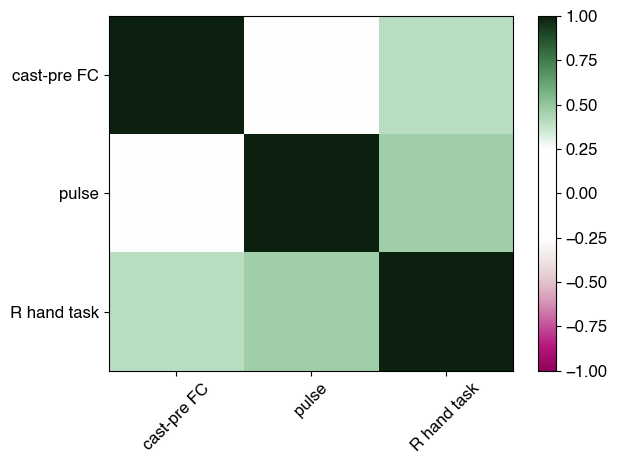

[0.037 0.    0.022]
[0.037 0.    0.033]


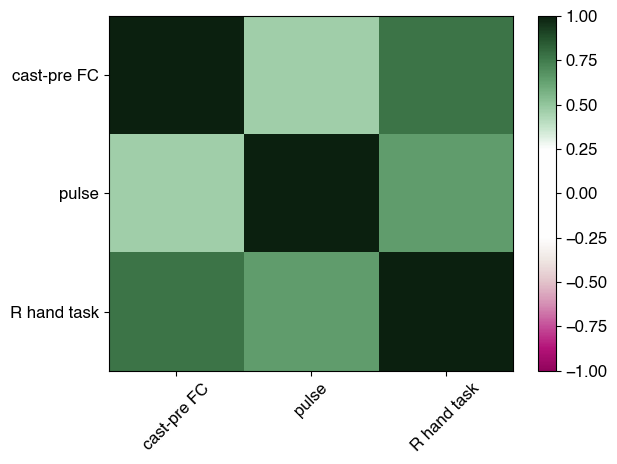

[0.069 0.014 0.003]
[0.069 0.021 0.009]


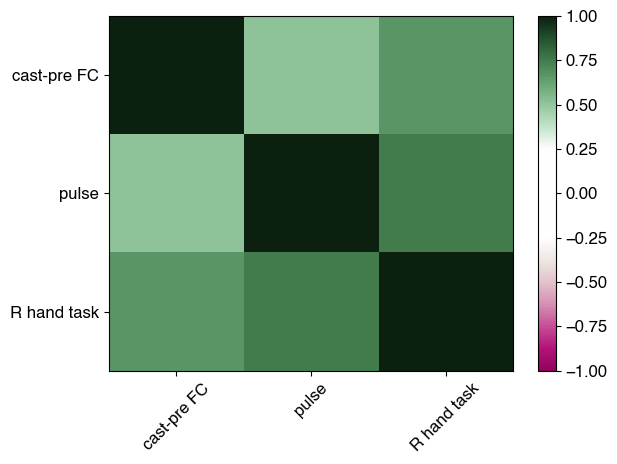

SIC01 PUTAMEN_LEFT
(222,)
(222,)
(222,)
SIC02 PUTAMEN_LEFT
(189,)
(189,)
(189,)
SIC03 PUTAMEN_LEFT
(172,)
(172,)
(172,)
[0.073 0.073 0.092]
[0.146 0.146 0.092]


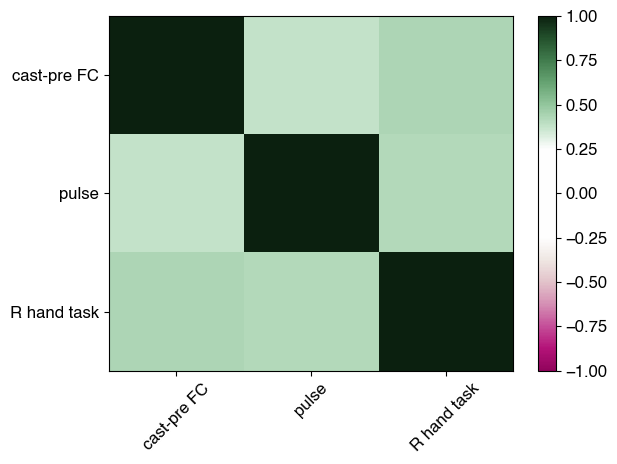

[0.006 0.    0.   ]
[0.006 0.    0.   ]


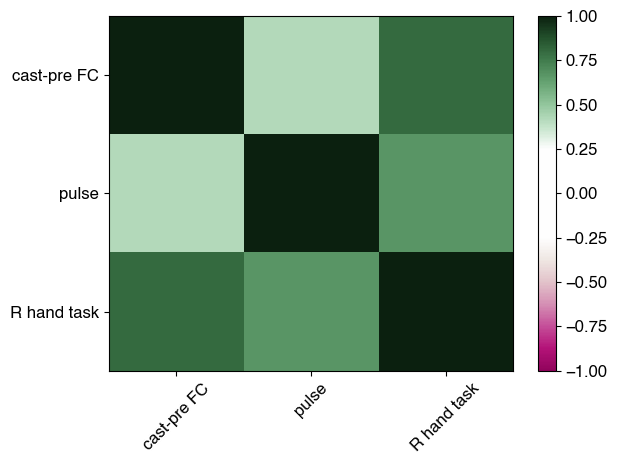

[0.275 0.011 0.001]
[0.275  0.0165 0.003 ]


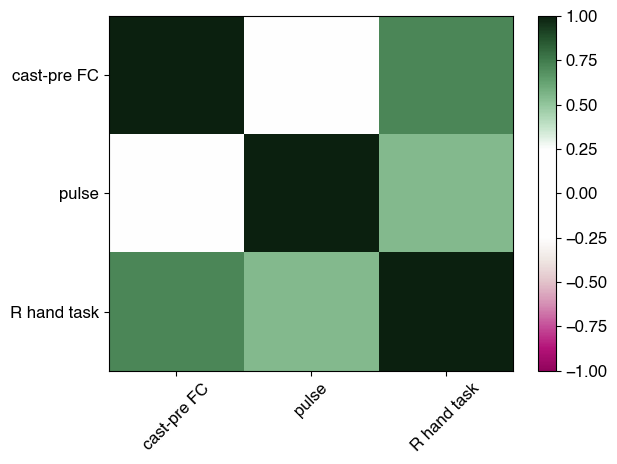

In [241]:
#spatial similarity in putamen and thalamic maps
for structure in ['THALAMUS_LEFT','PUTAMEN_LEFT']:
    corrorig=np.zeros((3,3,3))
    corrnull=np.zeros((3,1000,3,3))
    for e,s in enumerate(sub):
        print(s, structure)
        #pulse
        basefile=path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel'

        #pathtest=path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/'
        #reference for reshaping
        #pathorig=path+'/RosCha/Results/Tasks/rest/'+s+'/second_level_cifti_during_pulse-6-HRF_LR_fix_nolearning/cifti_cope1/tstat1_smooth6.0.dtseries.nii'
        #if not os.path.exists(pathorig):
        #    subprocess.call([workbenchdir+'wb_command','-cifti-convert','-from-nifti',pathorig.replace('_smooth6.0.dtseries.nii','.nii.gz'),pathorig.replace('tstat','zstat'),pathorig.replace('_smooth6.0',''),'-reset-timepoints','1','1'])
        #    subprocess.call(['python',path+'/RosCha/Scripts/tasks/smooth_cifti.py','-sub',s,'-task','motor','-altpath',pathorig.replace('_smooth6.0','')])

        pathorig=basefile+'_Lsm1_amplitudeseries_during_tstats_smooth6.0.dtseries.nii'




        if e!=0:

            net=pathorig
            tag3='dtseries'

            subprocess.call(['wb_command','-cifti-separate-all',net,'-volume',net.replace('.'+tag3+'.nii','_vol.nii.gz'),'-left',net.replace('.'+tag3+'.nii','_L.func.gii'),'-right',net.replace('.'+tag3+'.nii','_R.func.gii')])


            netV=net.replace('.'+tag3+'.nii','_vol.nii.gz')

            #save-flirt-load
            subcorticaldir=path+'/Dillan/preproc_2018-07-03/'+sub[e]+'/subcortical_mask_222'
            #if s==0:
            subcorticalmask=path+'/Dillan/preproc_2018-07-03/'+sub[e]+'/subcortical_mask/subcortical_mask_LR_333.nii'


            #reshape
            subprocess.call(['flirt','-in',netV,'-ref',subcorticalmask,'-applyxfm','-usesqform','-out',netV.replace('.nii.gz','_333.nii.gz')])
            rightfile=net.replace('.'+tag3+'.nii','_R.func.gii')
            leftfile=net.replace('.'+tag3+'.nii','_L.func.gii')
            Subcortical=netV.replace('.nii.gz','_333.nii.gz')
            subprocess.call(['wb_command','-cifti-create-dense-timeseries',net.replace('.'+tag3+'.nii','_333.dtseries.nii'),'-volume',Subcortical,subcorticalmask,'-left-metric',leftfile,'-roi-left',subcorticaldir+'/L.atlasroi.32k_fs_LR.shape.gii','-right-metric',rightfile,'-roi-right',subcorticaldir+'/R.atlasroi.32k_fs_LR.shape.gii'])
            maskeddata=nibabel.load(net.replace('.'+tag3+'.nii','_333.dtseries.nii')).get_fdata()[0]
            subprocess.call(['rm',rightfile,leftfile,Subcortical,netV])
            pathorig=pathorig.replace('.'+tag3+'.nii','_333.dtseries.nii')

        raw=nibabel.load(pathorig)
        axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
        # You'll want the brain model axis
        time_axis, brain_model_axis = axes
        loc=np.where(brain_model_axis.name=='CIFTI_STRUCTURE_'+structure)
        pulseorig=raw.get_fdata()[0][loc]#/raw.get_fdata()[2])[loc]
        pulsenull=testMoranSTRUCTURE(path+'/RosCha/Tools/Moran/'+s+'/dmat_cort_subcort',pulseorig,structure)


        #FCdiff #need to compute the t stats

        pathtest=path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/'
        pathorig=pathtest+'cast-pre_tstats_LSM1.dtseries.nii'#cast-pre_Lsm1avg_dconn_cohensd.dtseries.nii'
        fcdifforig=nibabel.load(pathorig).get_fdata()[0][loc]
        fcdiffnull=testMoranSTRUCTURE(path+'/RosCha/Tools/Moran/'+s+'/dmat_cort_subcort',fcdifforig,structure)



        #task 3might want to use t if we switch allto t (and smooth it)
        n='3'#8'#9'#
        basefile=path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel'
        #reference
        if e==0:

            pathref=basefile+'_Lsm1_peakseries_statistics_smooth6.0_tripletop40adjustedAMP-PEAK-SPREAD_thlamicvox-2-_Lsm1FCcastpre-1-_overlap-3.dtseries.nii'
        else:
            pathref=basefile+'_Lsm1_peakseries_statistics_smooth6.0_tripletop20adjustedAMP-PEAK-SPREAD_thlamicvox_333-2-_Lsm1FCcastpre-1-_overlap-3.dtseries.nii'


        raw=nibabel.load(pathref)
        axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
        # You'll want the brain model axis
        time_axis, brain_model_axis = axes

        #reshape if not e==0
        pathorig=path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope'+n+'/tstat3_smooth6.0.dtseries.nii'
        if not os.path.exists(pathorig):
            subprocess.call([workbenchdir+'wb_command','-cifti-convert','-from-nifti',pathorig.replace('_smooth6.0.dtseries.nii','.nii.gz'),pathorig.replace('tstat','zstat'),pathorig.replace('_smooth6.0',''),'-reset-timepoints','1','1'])
            subprocess.call(['python',path+'/RosCha/Scripts/tasks/smooth_cifti.py','-sub',s,'-task','motor','-altpath',pathorig.replace('_smooth6.0','')])

            '''raw=nibabel.load(pathorig)
            data=raw.get_fdata()
            data=-data
            img=ci.Cifti2Image(np.array(data), header=raw.header)
            ci.save(img,pathorig.replace('.dtseries.nii','inverse.dtseries.nii'))
        pathorig=pathorig.replace('.dtseries.nii','inverse.dtseries.nii')'''

        if e!=0:





            net=pathorig
            tag3='dtseries'

            subprocess.call(['wb_command','-cifti-separate-all',net,'-volume',net.replace('.'+tag3+'.nii','_vol.nii.gz'),'-left',net.replace('.'+tag3+'.nii','_L.func.gii'),'-right',net.replace('.'+tag3+'.nii','_R.func.gii')])


            netV=net.replace('.'+tag3+'.nii','_vol.nii.gz')

            #save-flirt-load
            subcorticaldir=path+'/Dillan/preproc_2018-07-03/'+sub[e]+'/subcortical_mask_222'
            #if s==0:
            subcorticalmask=path+'/Dillan/preproc_2018-07-03/'+sub[e]+'/subcortical_mask/subcortical_mask_LR_333.nii'


            #reshape
            subprocess.call(['flirt','-in',netV,'-ref',subcorticalmask,'-applyxfm','-usesqform','-out',netV.replace('.nii.gz','_333.nii.gz')])
            rightfile=net.replace('.'+tag3+'.nii','_R.func.gii')
            leftfile=net.replace('.'+tag3+'.nii','_L.func.gii')
            Subcortical=netV.replace('.nii.gz','_333.nii.gz')
            subprocess.call(['wb_command','-cifti-create-dense-timeseries',net.replace('.'+tag3+'.nii','_333.dtseries.nii'),'-volume',Subcortical,subcorticalmask,'-left-metric',leftfile,'-roi-left',subcorticaldir+'/L.atlasroi.32k_fs_LR.shape.gii','-right-metric',rightfile,'-roi-right',subcorticaldir+'/R.atlasroi.32k_fs_LR.shape.gii'])
            maskeddata=nibabel.load(net.replace('.'+tag3+'.nii','_333.dtseries.nii')).get_fdata()[0]
            subprocess.call(['rm',rightfile,leftfile,Subcortical,netV])
            pathorig=pathorig.replace('.'+tag3+'.nii','_333.dtseries.nii')
        taskorig=nibabel.load(pathorig).get_fdata()[0][loc]
        tasknull=testMoranSTRUCTURE(path+'/RosCha/Tools/Moran/'+s+'/dmat_cort_subcort',taskorig,structure)

        pulseorig[np.where(pulseorig<0)]=0
        fcdifforig[np.where(fcdifforig<0)]=0

        taskorig[np.where(taskorig<0)]=0
        pulsenull[np.where(pulsenull<0)]=0
        fcdiffnull[np.where(fcdiffnull<0)]=0
        tasknull[np.where(tasknull<0)]=0
        corrorig[e]=np.corrcoef([fcdifforig,pulseorig,taskorig])
        corrnull[e][0]=np.corrcoef([fcdiffnull[999],pulsenull[0],tasknull[998]])
        corrnull[e][1]=np.corrcoef([fcdiffnull[0],pulsenull[1],tasknull[999]])

        for i in range(2,1000):
            corrnull[e][i]=np.corrcoef([fcdiffnull[i-1],pulsenull[i],tasknull[i-2]])

    pvalmat=np.ones((3,3,3))
    for e in range(3):
        for i in range(3):
            for j in range(i+1,3):
                pvalmat[e][i][j]=len(np.where(corrnull[e].T[j][i]>corrorig[e][i][j])[0])/1000.
                pvalmat[e][i][j]=np.min([1-pvalmat[e][i][j],pvalmat[e][i][j]])
                pvalmat[e][j][i]=pvalmat[e][i][j]

        mycmap=mycolorscale("greeple",limpos=1,limneg=-1,threshold=0.25,rev=True)
        print(pvalmat[e][np.triu_indices(3,1)])
        print(fdr(pvalmat[e][np.triu_indices(3,1)]))
        plt.imshow(corrorig[e],vmin=-1,vmax=1,cmap=mycmap,interpolation='none', rasterized=True)

        plt.grid(False)

        plt.xticks([0,1,2],['cast-pre FC','pulse','R hand task'],rotation=45)#all mvt task
        plt.yticks([0,1,2],['cast-pre FC','pulse','R hand task'])
        plt.axis('tight')
        plt.colorbar()
        plt.tight_layout()
        plt.savefig(path+'/RosCha/Results/figures/plasticitypulses/mat_'+sub[e]+'_correlation_tstats_'+structure+'.png')
        plt.show()

13.610503339767396
0.4912407875061033
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
/data/nil-bluearc/GMT/RosCha/Results/Tasks/rest/SIC03/handseed_valselect.dtseries.nii
nothing on right hemi roi


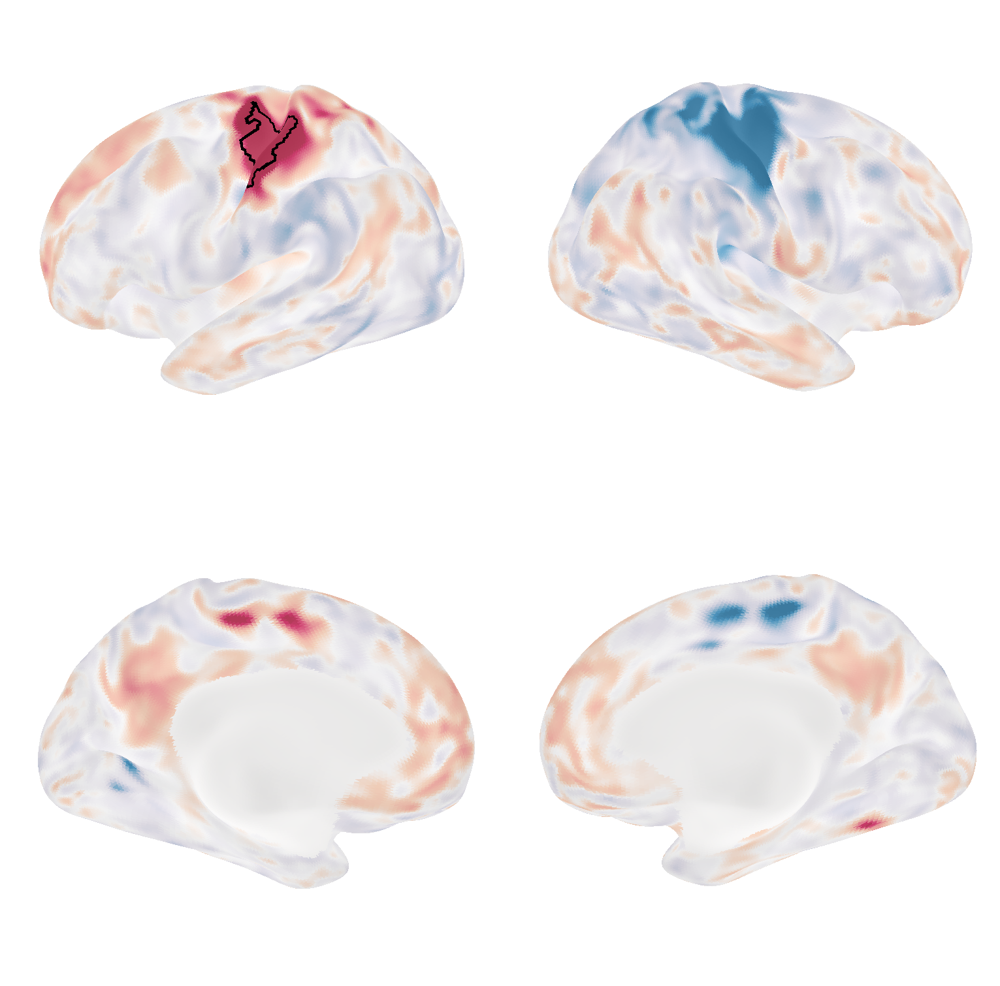

/tmp/ipykernel_2274/3779326731.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/tmp/ipykernel_2274/3779326731.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


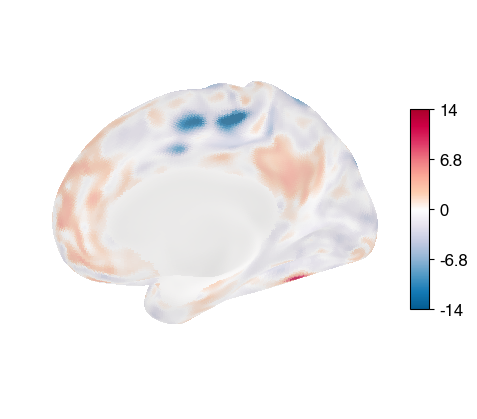

[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:433: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(


raw 0 ready
raw 1 ready
raw 2 ready


/tmp/ipykernel_2274/87443132.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


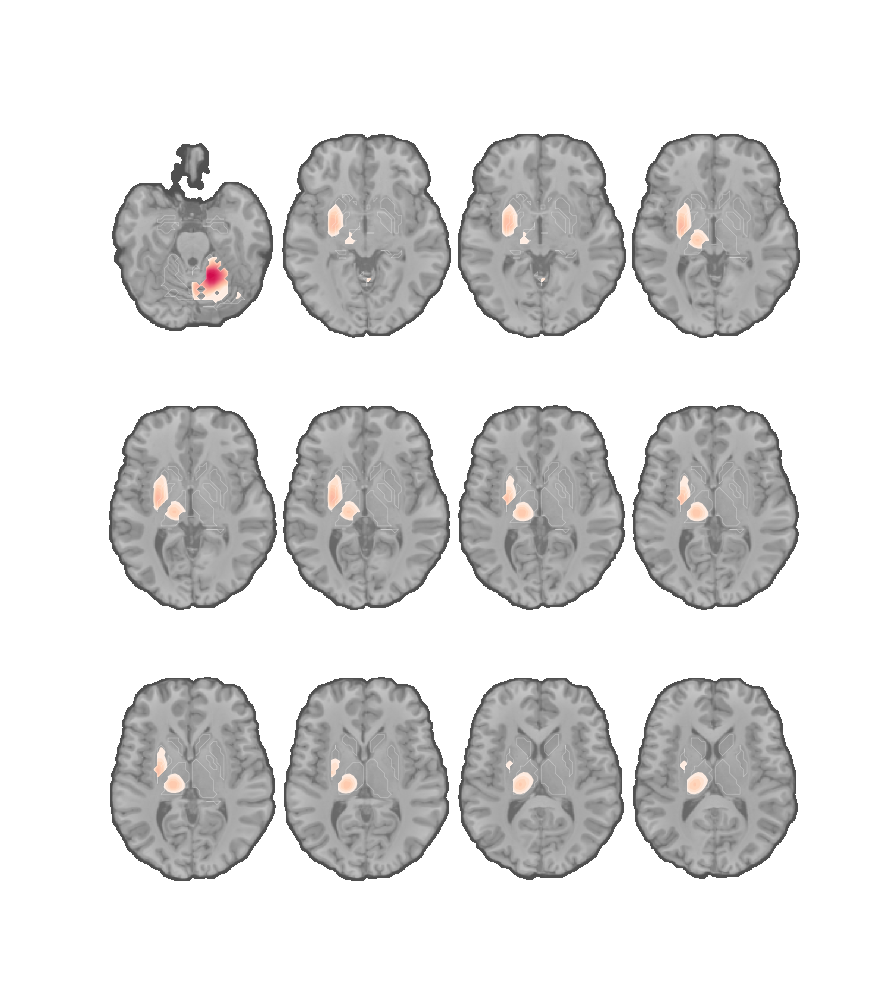

29.702416152954076
0.46899737715721124
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
/data/nil-bluearc/GMT/RosCha/Results/Tasks/rest/SIC03/handseed_valselect.dtseries.nii
nothing on right hemi roi


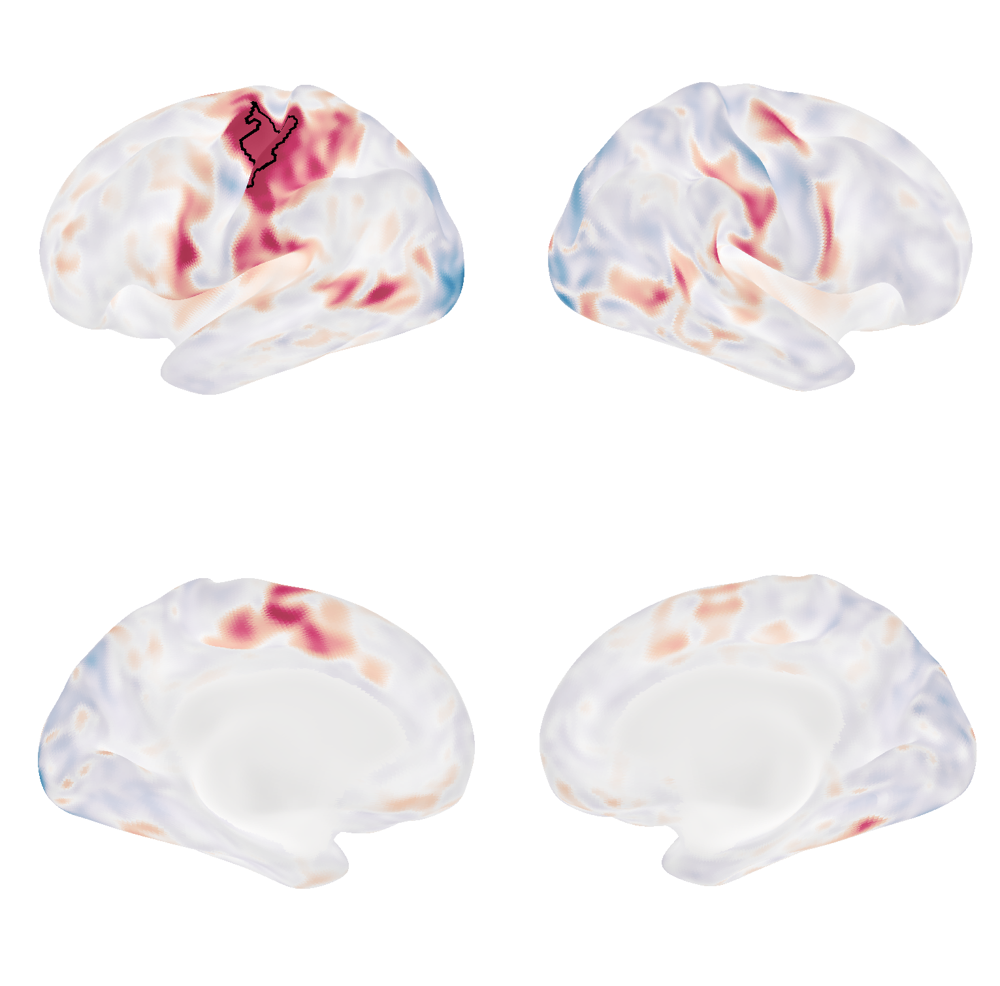

/tmp/ipykernel_2274/3779326731.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/tmp/ipykernel_2274/3779326731.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


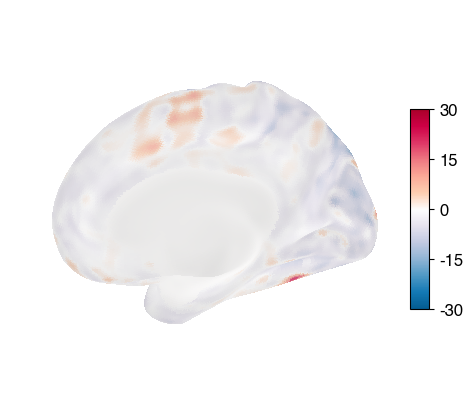

[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:433: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(


raw 0 ready
raw 1 ready
raw 2 ready


/tmp/ipykernel_2274/87443132.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


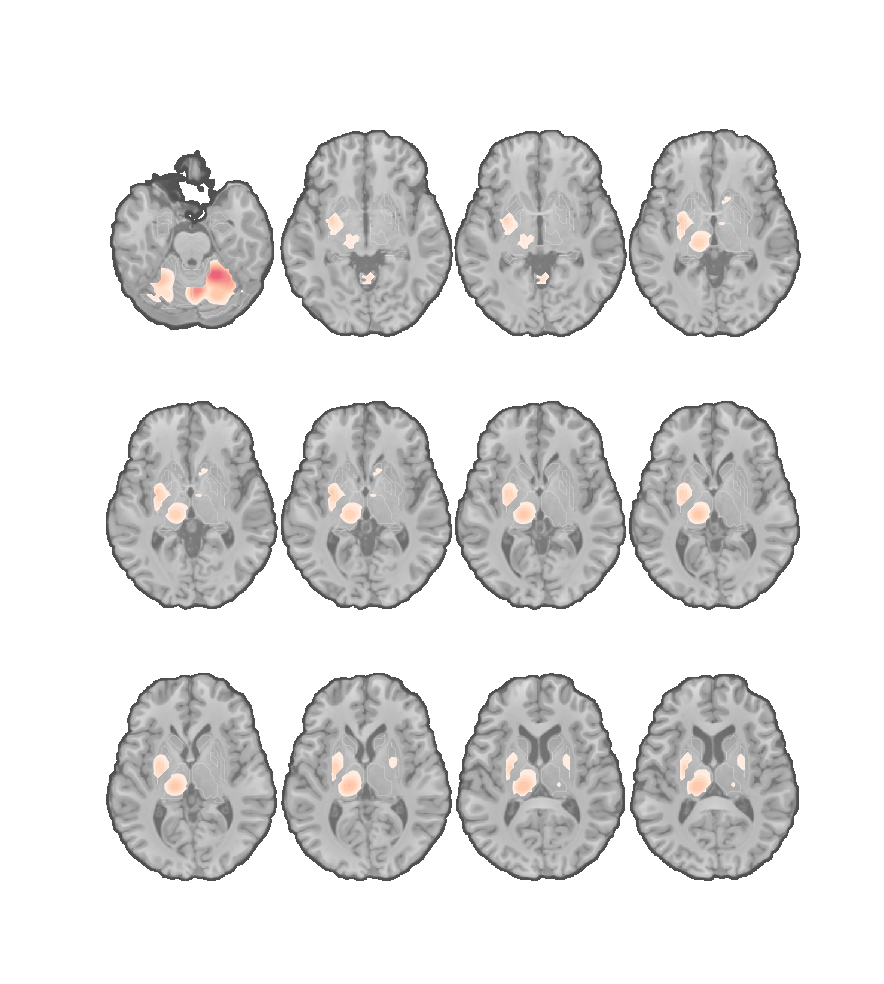

20.601955032348286
1.3938235044479361
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
/data/nil-bluearc/GMT/RosCha/Results/Tasks/rest/SIC03/handseed_valselect.dtseries.nii
nothing on right hemi roi


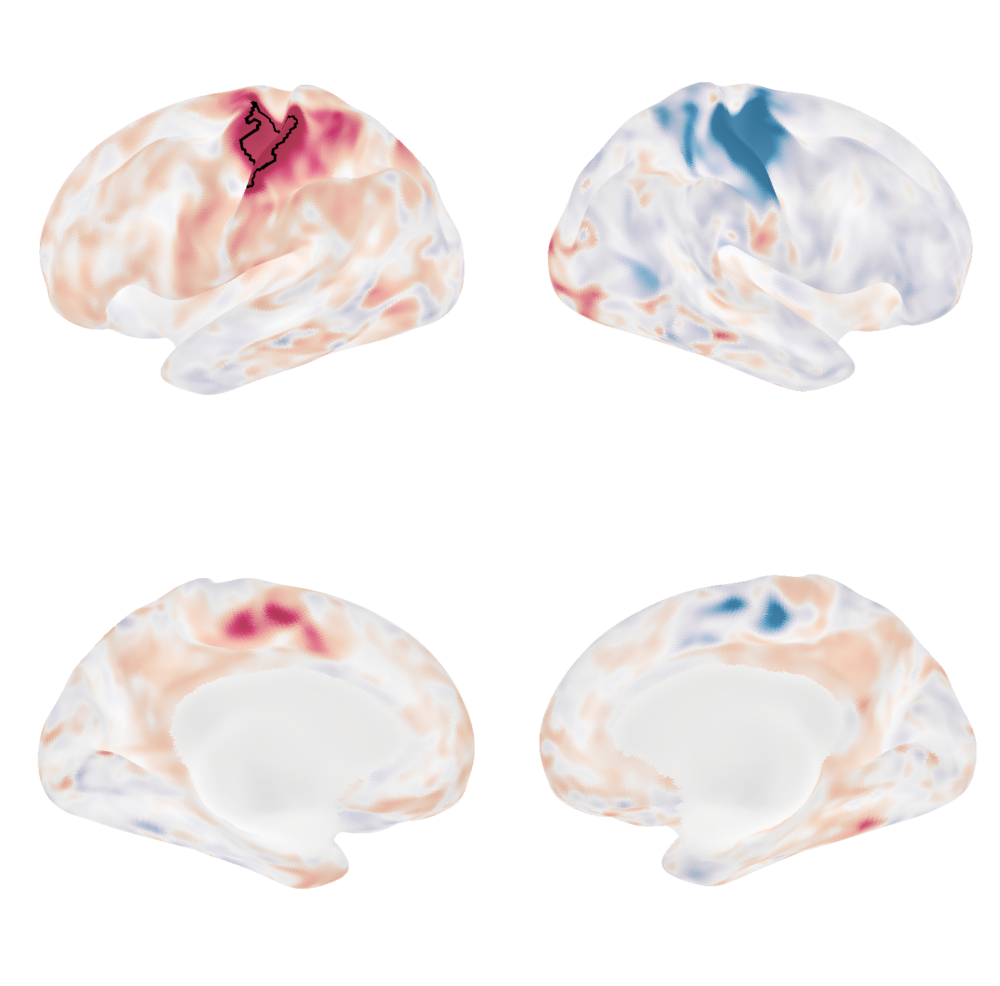

/tmp/ipykernel_2274/3779326731.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/tmp/ipykernel_2274/3779326731.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(savefig[:savefig.rfind('.')]+'-colorbar'+savefig[savefig.rfind('.'):])
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


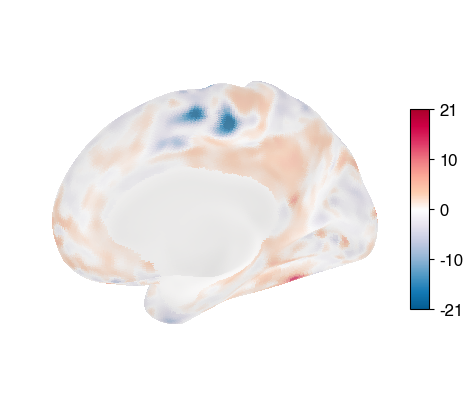

[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:433: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(


raw 0 ready
raw 1 ready
raw 2 ready


/tmp/ipykernel_2274/87443132.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


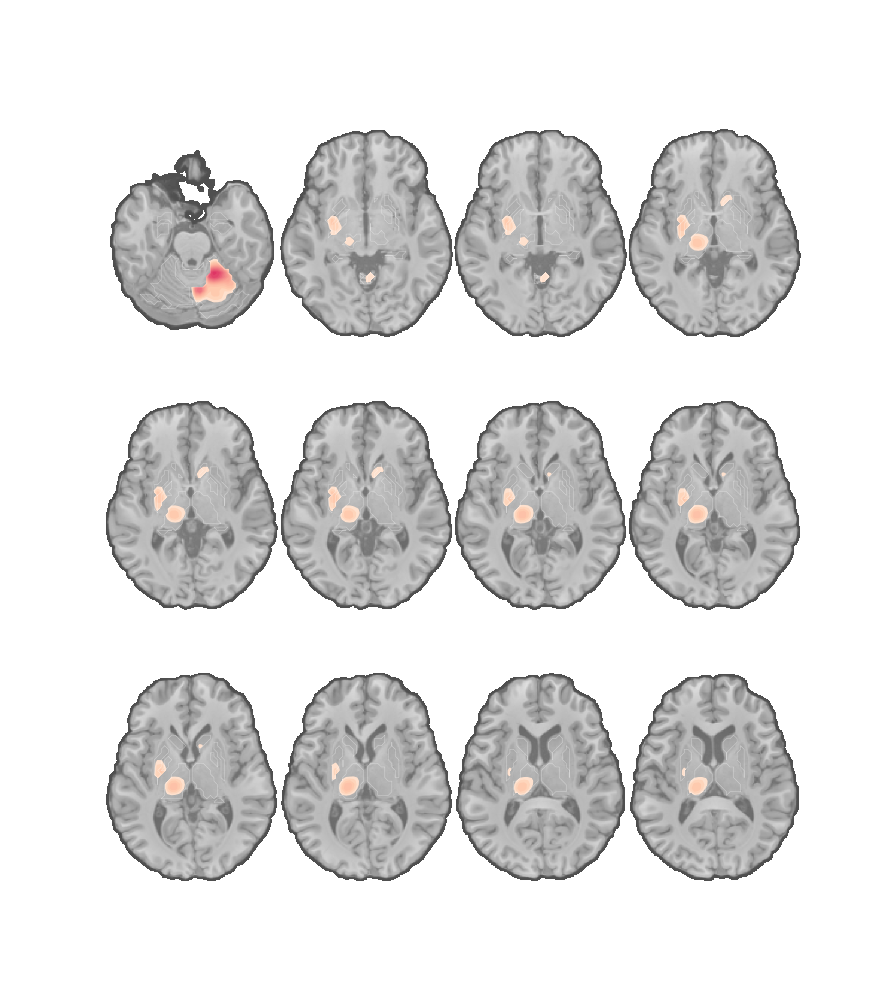

In [272]:
#plot right and t-l maps cortex, subcortex cerebellum

#then the same for motor mouth Rhand Rfoot R-Lhand ("salsea") + nuclei average
T1path=[path+'/RosCha/Structurals/cast/bet/'+s+'/T1_masked.nii.gz' for s in sub]
colorlist=[['salsea',False],['salsea',False]]#not using green do avoid confusion with overlap
for e,s in enumerate(sub):
    if e==0:
        pathorigall=[
           path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0.dtseries.nii',
            path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope6/tstat3_smooth6.0inverse.dtseries.nii'
        ]
    else:
        pathorigall=[
           path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0_333.dtseries.nii',
            path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope6/tstat3_smooth6.0inverse_333.dtseries.nii'
        ]
    taskname=['RightHandHCP','r-lhandhcp']
    for n2,pathorig in enumerate(pathorigall)
        raw=nibabel.load(pathorig)
        axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
        # You'll want the brain model axis
        time_axis, brain_model_axis = axes
        data=raw.get_fdata()[0]
        #if n2==1:
        #    data=-data#[np.where(data<0)]=0

        time_axis2=nibabel.cifti2.cifti2_axes.SeriesAxis(1,1,1)
        img=ci.Cifti2Image(np.array([data]), header=(time_axis2, brain_model_axis),
                    nifti_header=raw.nifti_header)
        ci.save(img,pathorig.replace('.dtseries.nii',('_POS.dtseries.nii')))
        pathorig=pathorig.replace('.dtseries.nii',('_POS.dtseries.nii'))


        raw=nibabel.load(pathorig)
        data=raw.get_fdata()[0]

        limmax=np.percentile(data,99)
        print(limmax)
        #thresh=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT')],80)
        thresh=np.percentile(data,70)
        print(thresh)
        mycmap=mycolorscale(colorlist[n2][0],limpos=limmax,limneg=-limmax,threshold=thresh,rev=colorlist[n2][1])
        plotsurfwithroi(pathorig,img_contour,roival=sideval[side2],vmin=-limmax,vmax=limmax,palette=mycmap,savefig=path+'/RosCha/Results/figures/plasticitypulses/surf_'+s+'_cortex_'+taskname[n2]+'_tstats.pdf',rollZ=20,scale=0.7,avg='median')

        mycmap=mycolorscale(colorlist[n2][0],limpos=limmax,limneg=-limmax,threshold=thresh,rev=colorlist[n2][1],Ncolor=50)

        color_listpos = [(mycmap(i)) for i in range(25,50)]#[::-1]
        color_listneg = [(mycmap(i)) for i in np.arange(24,-1,-1)]#[::-1]

        lim=[0,limmax]#limmaxall[e]]
        limpos=np.concatenate([[lim[0]],[(lim[1]-lim[0])*(i+1)/24+lim[0] for i in range(24)]],0)
        cutoff=np.where(limpos>=thresh)[0][0]
        limpos=limpos[cutoff:]
        color_listpos=color_listpos[cutoff:]
        color_listneg=color_listneg[cutoff:]
        #lim=[-limmaxall[e],0]
        limneg=limpos





        plt.figure(figsize=[9,10])
        plotvolindivT1(pathorig,T1path[e],ortho='z',cut_coords=[-21,-4,-2,-1,0,1,2,3,4,5,8,9],Nraw=3,colorpos=color_listpos,savefig=path+'/RosCha/Results/figures/plasticitypulses/vol_'+s+'_cereb_'+taskname[n2]+'_tstats.pdf',thresholdpos=limpos,Zannotate=False,smoothing=None)#colorneg=color_listneg,#thresholdneg=limneg,
        plt.show()


11.306276082992555
7.554767274856568
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-6 -5 -4 -3 -2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13] 4


/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/image/image.py:210: UserWarning: The parameter 'fwhm' for smoothing is specified as 0. Setting it to None (no smoothing will be performed)
  warnings.w

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


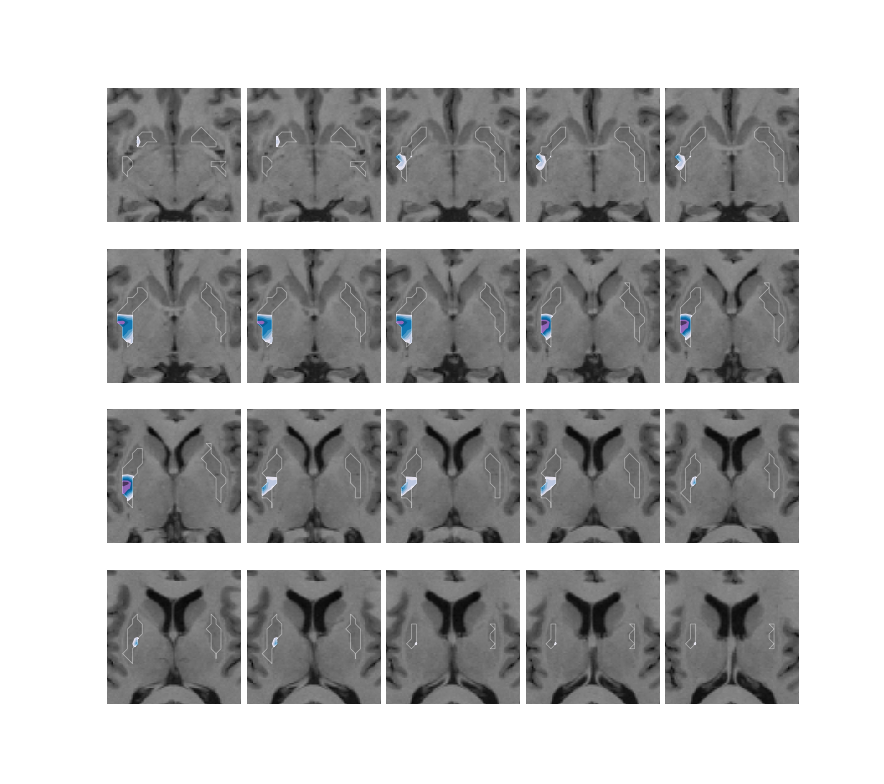

2.419117231369019
0.7025437057018279
[-6 -5 -4 -3 -2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13] 4


/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/image/image.py:210: UserWarning: The parameter 'fwhm' for smoothing is specified as 0. Setting it to None (no smoothing will be performed)
  warnings.w

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


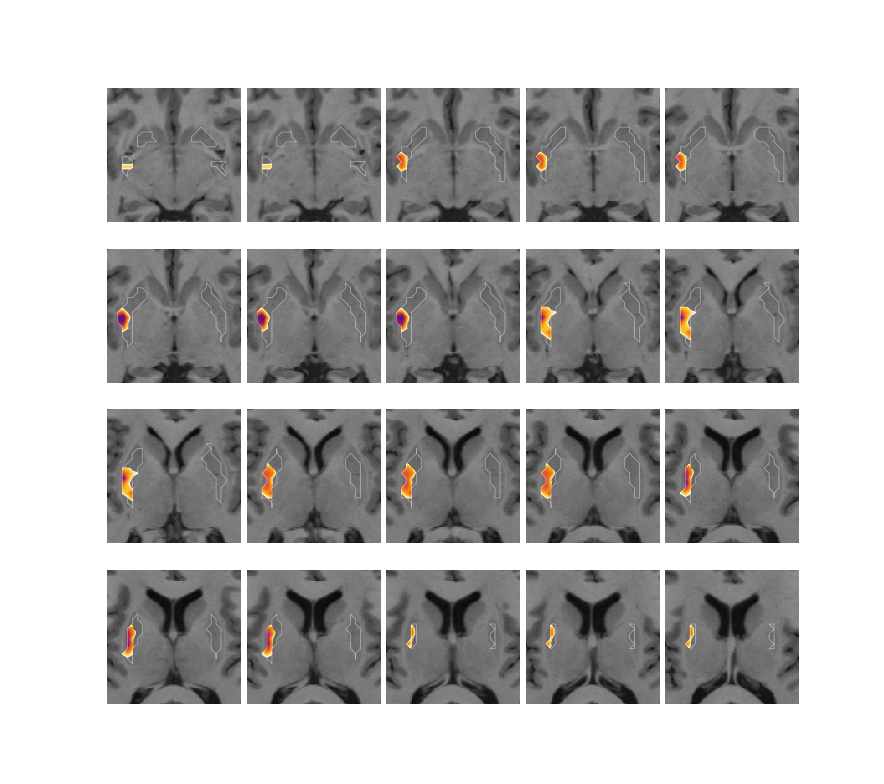

7.080545370578766
4.956936168670654
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-6 -5 -4 -3 -2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13] 4


/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/image/image.py:210: UserWarning: The parameter 'fwhm' for smoothing is specified as 0. Setting it to None (no smoothing will be performed)
  warnings.w

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


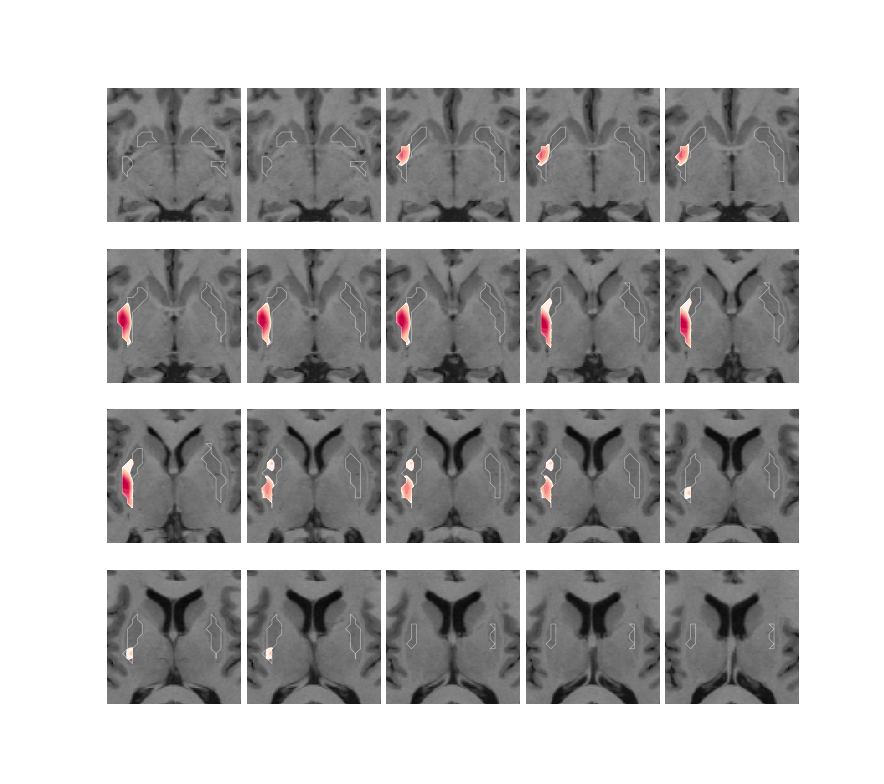

24.163454475402833
19.421817779541016
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-6 -5 -4 -3 -2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13] 4


/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/image/image.py:210: UserWarning: The parameter 'fwhm' for smoothing is specified as 0. Setting it to None (no smoothing will be performed)
  warnings.w

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/image/image.py:210: UserWarning: The parameter 'fwhm' for smoothing is specified as 0. Setting it to None (no smoothing will be performed)
  warnings.warn(


yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


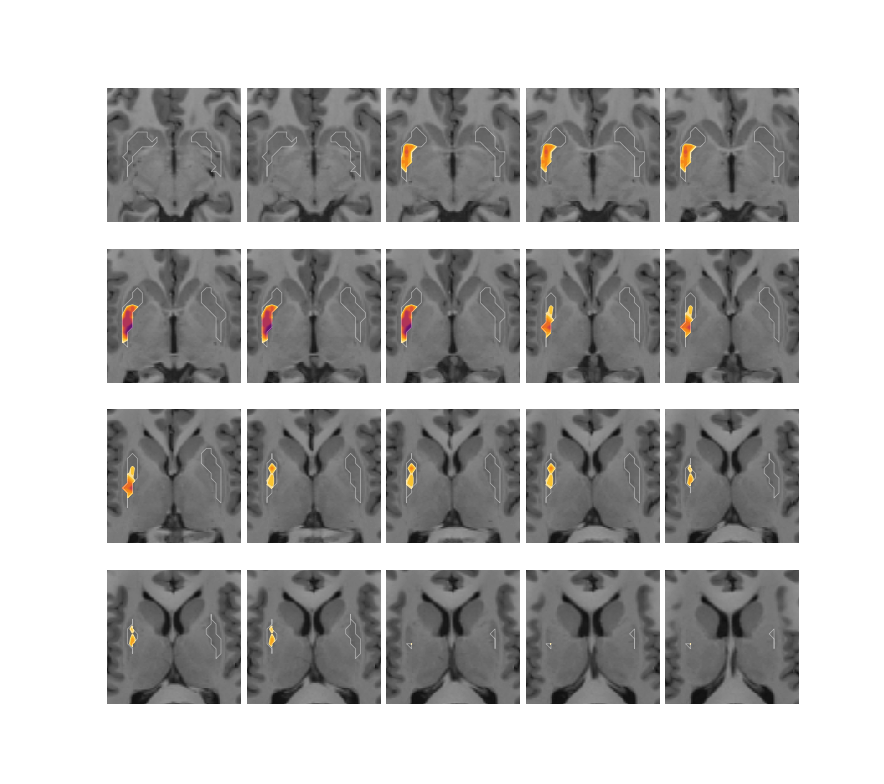

5.328488216400147
2.26405725479126
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-6 -5 -4 -3 -2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13] 4


/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/image/image.py:210: UserWarning: The parameter 'fwhm' for smoothing is specified as 0. Setting it to None (no smoothing will be performed)
  warnings.w

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


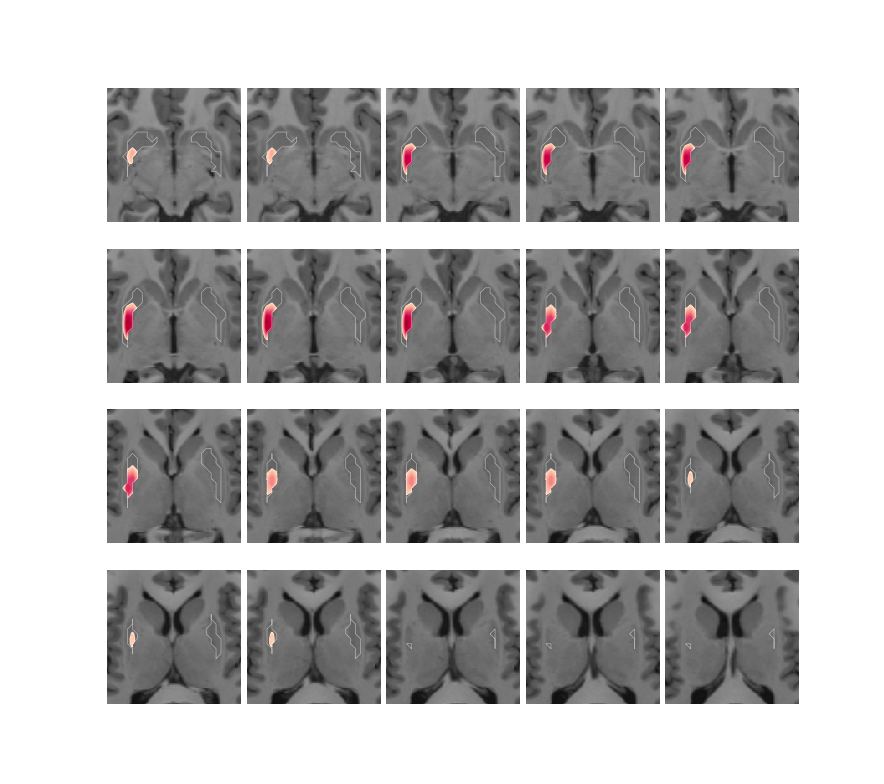

10.044882583618165
6.952570962905884
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-6 -5 -4 -3 -2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13] 4


/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/image/image.py:210: UserWarning: The parameter 'fwhm' for smoothing is specified as 0. Setting it to None (no smoothing will be performed)
  warnings.w

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


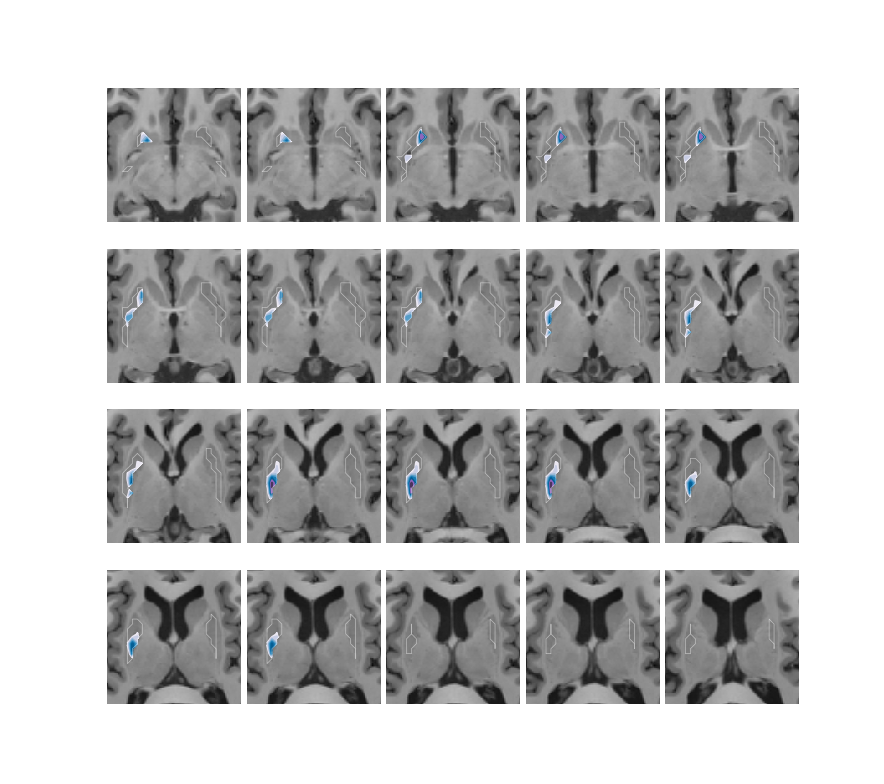

7.900767822265628
5.03828511238098
[-6 -5 -4 -3 -2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13] 4


/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/image/image.py:210: UserWarning: The parameter 'fwhm' for smoothing is specified as 0. Setting it to None (no smoothing will be performed)
  warnings.w

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


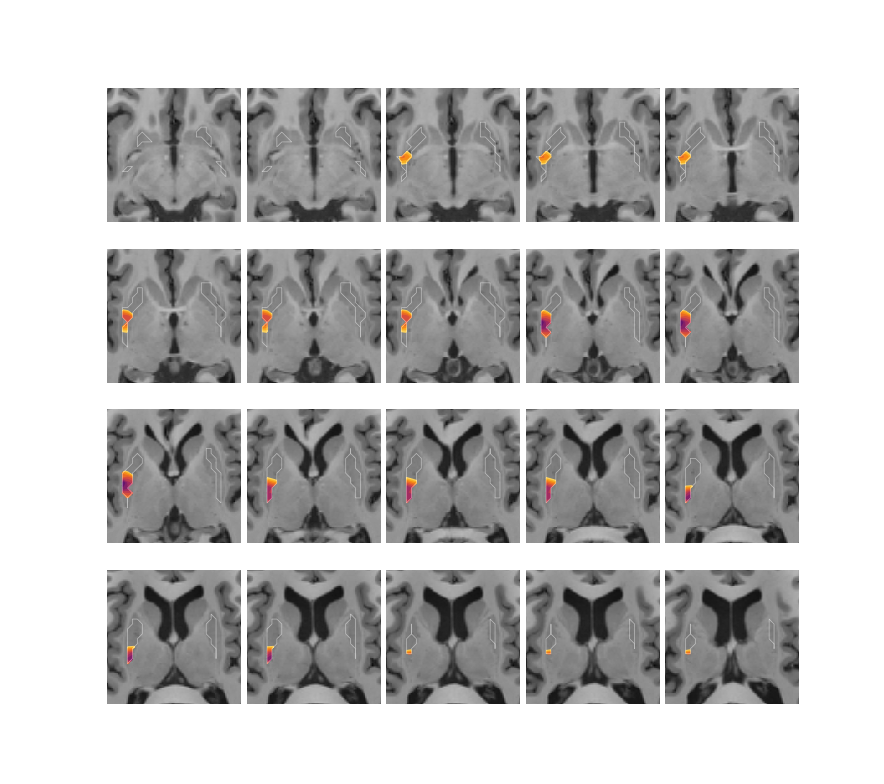

5.102748188972473
2.2690489053726193
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-6 -5 -4 -3 -2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13] 4


/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/image/image.py:210: UserWarning: The parameter 'fwhm' for smoothing is specified as 0. Setting it to None (no smoothing will be performed)
  warnings.w

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


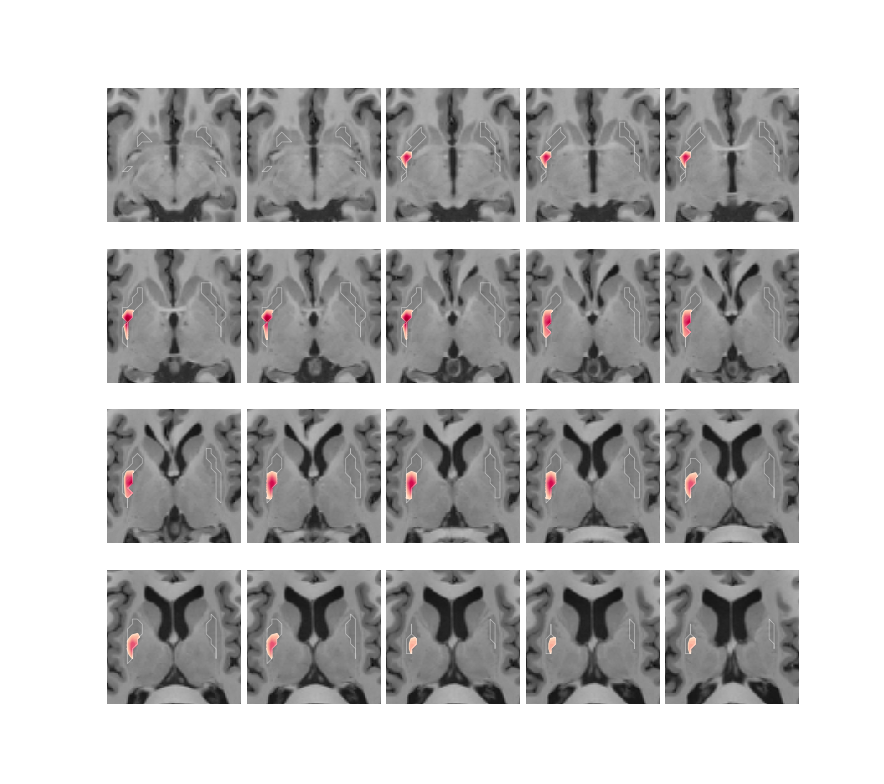

12.493444418907163
9.534549713134766
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] 4


/tmp/ipykernel_2274/171493490.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/pyt

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


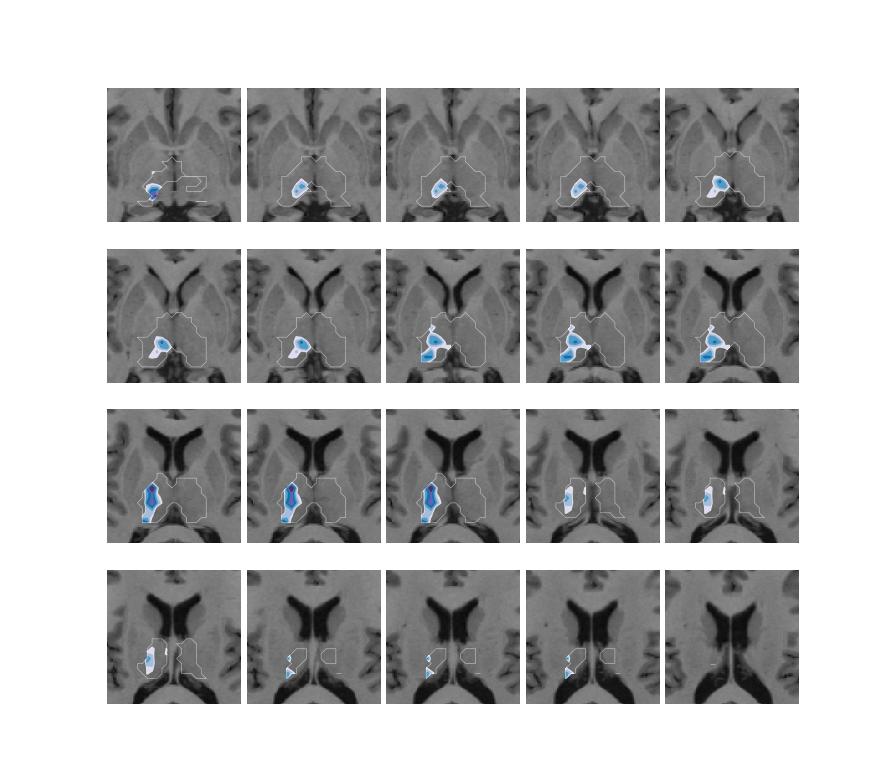

2.7279369592666614
0.2689005583524702
[-2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] 4


/tmp/ipykernel_2274/171493490.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/pyt

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1454: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1455: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


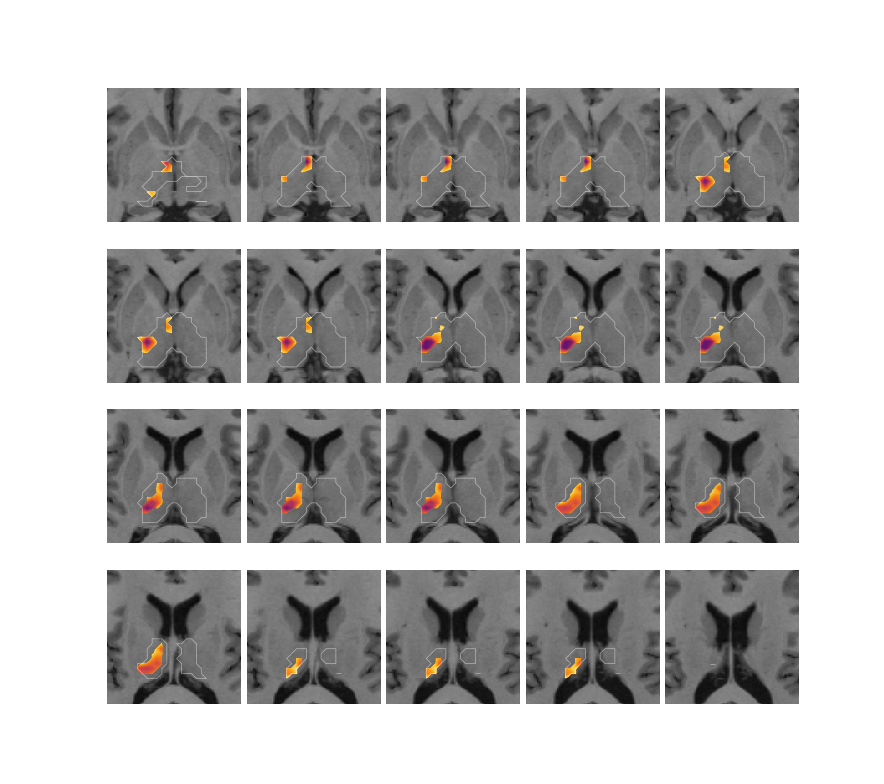

6.615514671802519
2.8588223457336426
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] 4


/tmp/ipykernel_2274/171493490.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/pyt

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


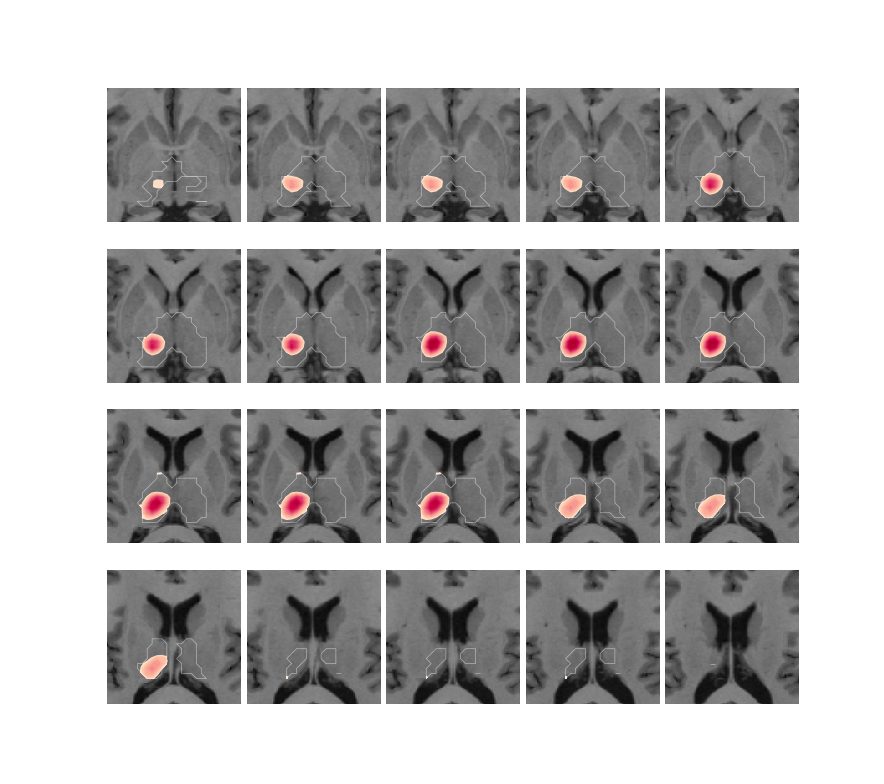

25.801497573852537
22.190581130981442
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] 4


/tmp/ipykernel_2274/171493490.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/pyt

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


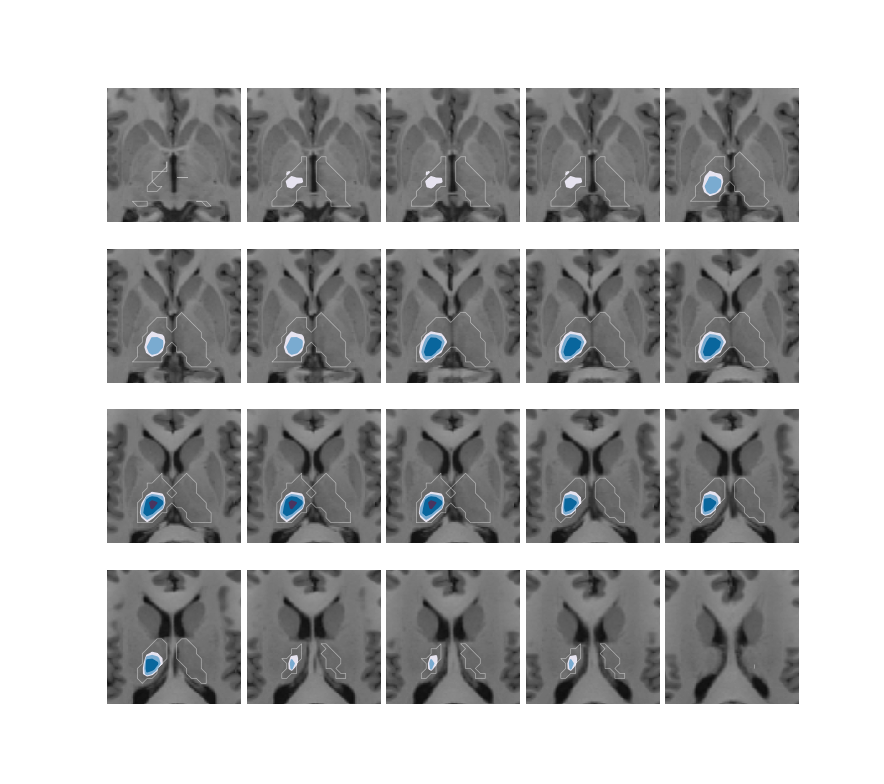

5.9192172479629495
1.9231260657310485
[-2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] 4


/tmp/ipykernel_2274/171493490.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/pyt

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


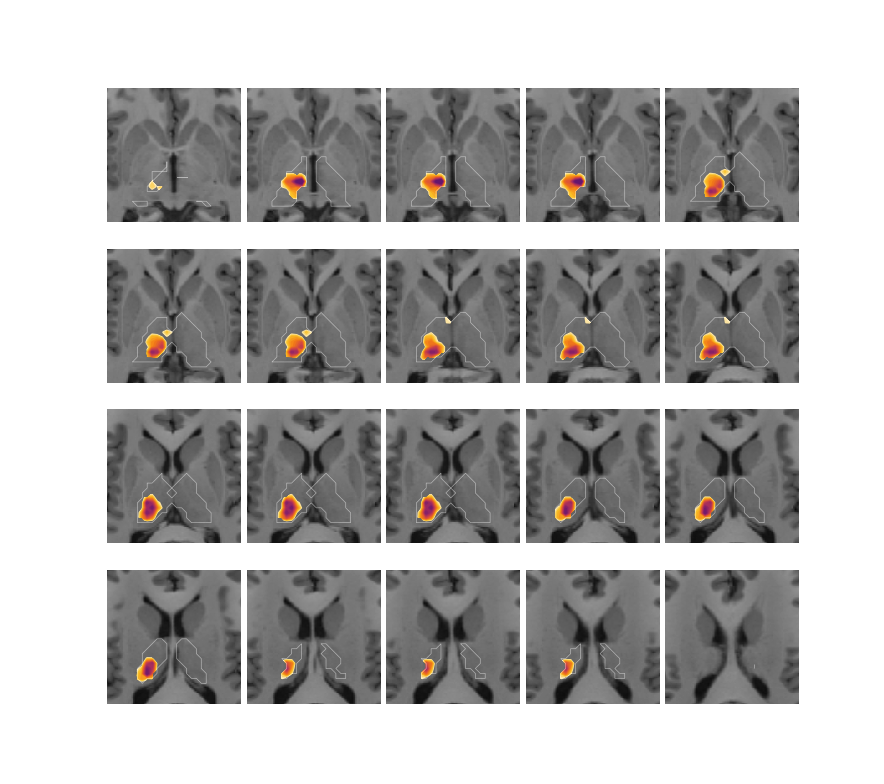

3.951839268207548
1.4583689689636223
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] 4


/tmp/ipykernel_2274/171493490.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/pyt

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


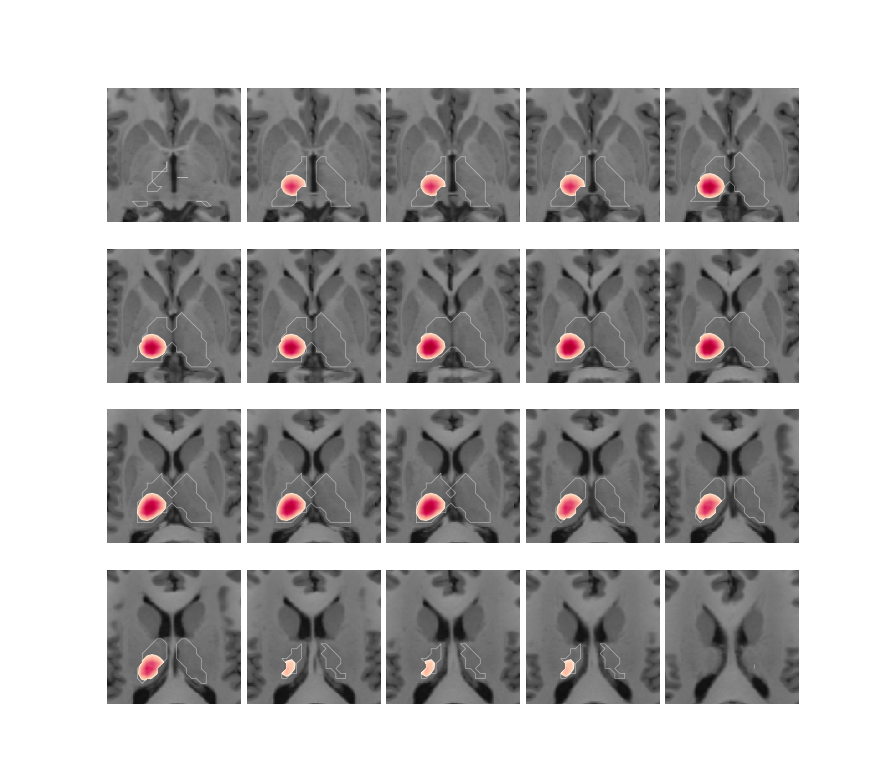

12.365533542633058
8.78635311126709
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] 4


/tmp/ipykernel_2274/171493490.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/pyt

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1454: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1455: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


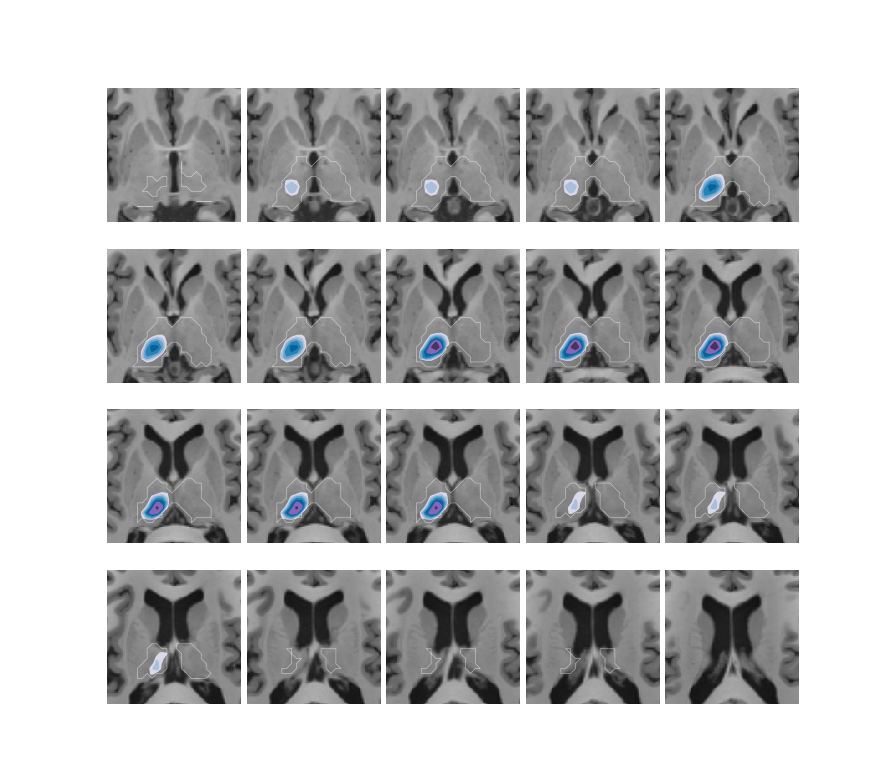

9.90982370376587
5.390455722808838
[-2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] 4


/tmp/ipykernel_2274/171493490.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/pyt

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1454: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1455: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


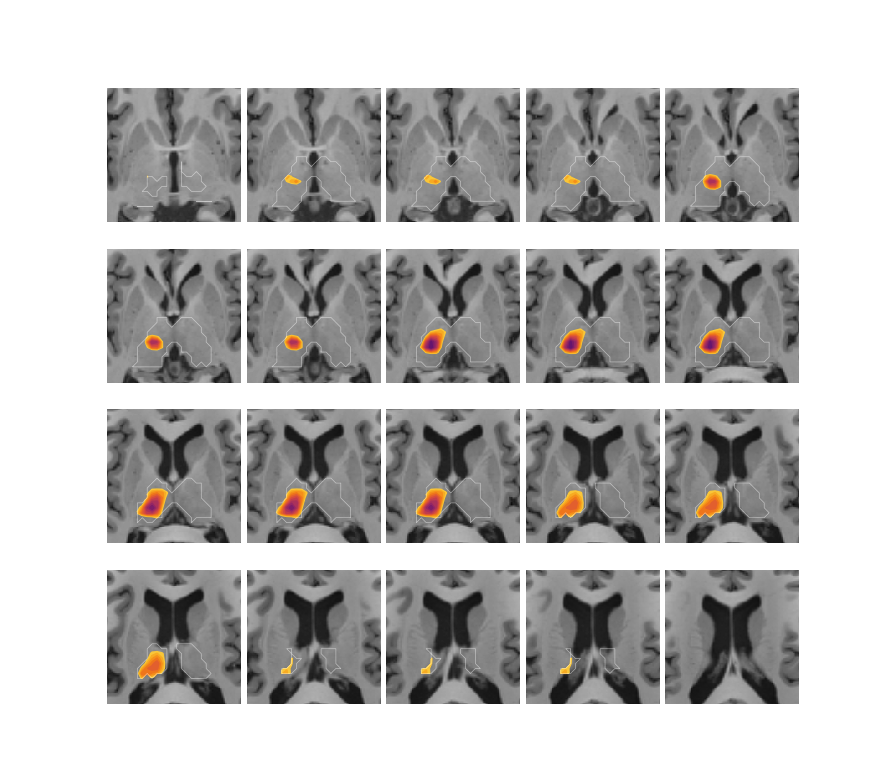

6.036588275432588
2.1546988487243652
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] 4


/tmp/ipykernel_2274/171493490.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/pyt

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1454: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1455: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


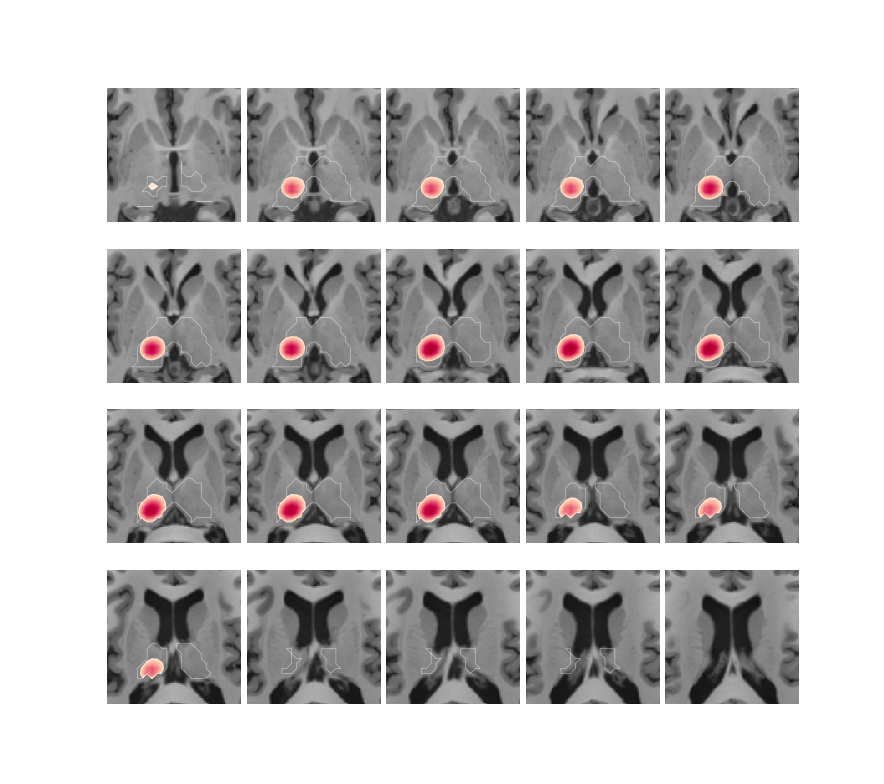

In [234]:
#plot thalamus and putamen tstats of pulse, change in fc, and motor hand movement

#then the same for motor mouth Rhand Rfoot R-Lhand ("salsea") + nuclei average
for structure in ['PUTAMEN_LEFT','THALAMUS_LEFT']:
    T1path=[path+'/RosCha/Structurals/cast/bet/'+s+'/T1_masked.nii.gz' for s in sub]
    colorlist=[['salsea2',True],['matket',False],['salsea',False]]#not using green do avoid confusion with overlap
    for e,s in enumerate(sub):
        if e==0:
            pathorigall=[
                path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_amplitudeseries_during_tstats_smooth6.0.dtseries.nii',#second_level_cifti_during_pulse-6-HRF_LR_fix_nolearning/cifti_cope1/tstat1_smooth6.0.dtseries.nii',#path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_peakseries_statistics_smooth6.0.dtseries.nii',
                path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/cast-pre_tstats_LSM1.dtseries.nii',
                path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0.dtseries.nii'
            ]
        else:
            pathorigall=[
                path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_amplitudeseries_during_tstats_smooth6.0_333.dtseries.nii',#second_level_cifti_during_pulse-6-HRF_LR_fix_nolearning/cifti_cope1/tstat1_smooth6.0_333.dtseries.nii',#path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_peakseries_statistics_smooth6.0_333.dtseries.nii',
                path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/cast-pre_tstats_LSM1.dtseries.nii',
                path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0_333.dtseries.nii'
            ]
        taskname=['pulse','fccastprelsm1','RightHandHCP']
        for n2,pathorig in enumerate(pathorigall):

            raw=nibabel.load(pathorig)
            axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
            # You'll want the brain model axis
            time_axis, brain_model_axis = axes
            data=raw.get_fdata()[0]
            data[np.where(data<0)]=0
            data[np.where(brain_model_axis.name!='CIFTI_STRUCTURE_'+structure)]=0
            time_axis2=nibabel.cifti2.cifti2_axes.SeriesAxis(1,1,1)
            img=ci.Cifti2Image(np.array([data]), header=(time_axis2, brain_model_axis),
                        nifti_header=raw.nifti_header)
            ci.save(img,pathorig.replace('.dtseries.nii',('_POS_'+structure+'.dtseries.nii')))
            pathorig=pathorig.replace('.dtseries.nii',('_POS_'+structure+'.dtseries.nii'))


            raw=nibabel.load(pathorig)
            data=raw.get_fdata()[0]

            limmax=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_'+structure)],99.5)
            print(limmax)
            #thresh=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT')],80)
            thresh=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_'+structure)],70)
            print(thresh)

            mycmap=mycolorscale(colorlist[n2][0],limpos=limmax,limneg=-limmax,threshold=thresh,Ncolor=50,rev=colorlist[n2][1])
            color_listpos = [(mycmap(i)) for i in range(25,50)]#[::-1]
            color_listneg = [(mycmap(i)) for i in np.arange(24,-1,-1)]#[::-1]

            lim=[0,limmax]#limmaxall[e]]
            limpos=np.concatenate([[lim[0]],[(lim[1]-lim[0])*(i+1)/24+lim[0] for i in range(24)]],0)
            cutoff=np.where(limpos>=thresh)[0][0]
            limpos=limpos[cutoff:]
            color_listpos=color_listpos[cutoff:]
            color_listneg=color_listneg[cutoff:]
            #lim=[-limmaxall[e],0]
            limneg=limpos

            provlab=np.array([])#4, 6, 7, 10, 11] )
            net=path+'/RosCha/Structurals/cast/THOMAS/'+s+'thomasfull_T1.nii.gz'#path+'/RosCha/Structurals/cast/TRIO/'+s+'/ThalamicNuclei.v12.T1_on_TRIO_Y_NDC_222_BIN.nii.gz'

            if structure=='THALAMUS_LEFT':
                plotvolindivThalamT1(pathorig,net,T1path[e],segselect=provlab,ortho='z',colorneg=color_listneg,thresholdneg=limneg,colorpos=color_listpos,thresholdpos=limpos,Zannotate=False,smoothing=0,savefig=path+'/RosCha/Results/figures/plasticitypulses/vol_'+s+'_'+taskname[n2]+'_tstats_'+structure+'.pdf')#scale=5,space=None)
            else:
                plotvolindivPutamenT1(pathorig,T1path[e],ortho='z',colorneg=color_listneg,thresholdneg=limneg,colorpos=color_listpos,thresholdpos=limpos,Zannotate=False,smoothing=0,savefig=path+'/RosCha/Results/figures/plasticitypulses/vol_'+s+'_'+taskname[n2]+'_tstats_'+structure+'.pdf')#scale=5,space=None)
                
            #testplotnucleiavg(s,pathorig,path+'/RosCha/Results/figures/plasticitypulses/bar_'+s+'_'+taskname[n2]+'_tstats.pdf',limmax,color_listpos[::-1][0])#,thresh)
            #testplotnucleiavg(s,pathorig,path+'/RosCha/Results/figures/plasticitypulses/bar_'+s+'_'+taskname[n2]+'_tstats_thresh80.pdf',limmax,color_listpos[::-1][0],thresh)
    

12.493444418907163
9.534549713134766
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]


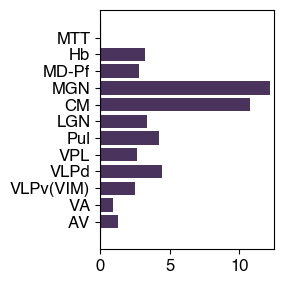

2.7279369592666614
0.2689005583524702


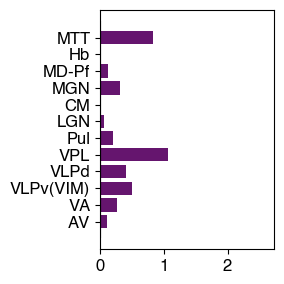

6.615514671802519
2.8588223457336426
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]


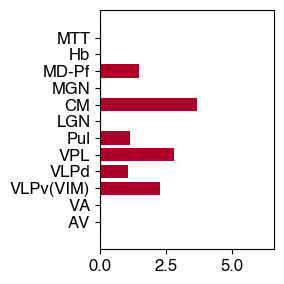

25.801497573852537
22.190581130981442
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]


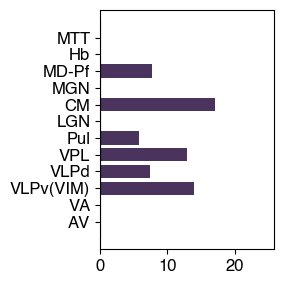

5.9192172479629495
1.9231260657310485


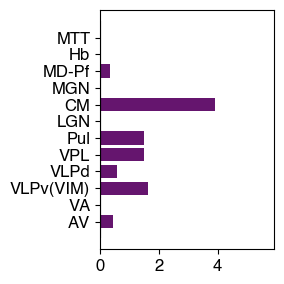

3.951839268207548
1.4583689689636223
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]


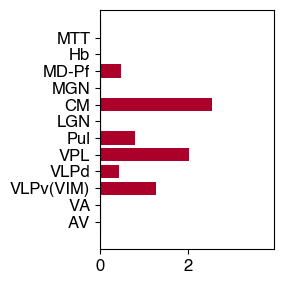

12.365533542633058
8.78635311126709
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


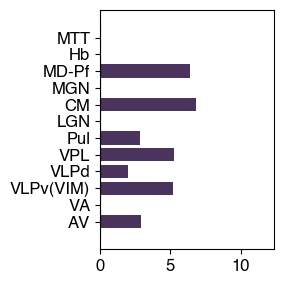

9.90982370376587
5.390455722808838


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


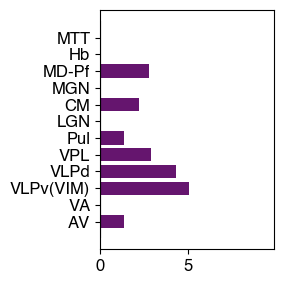

6.036588275432588
2.1546988487243652
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


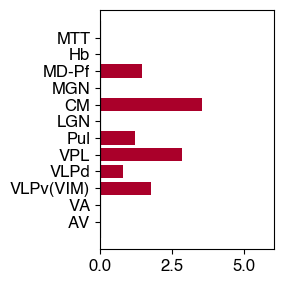

In [266]:
#quantification pulse fc change and mtor hand movement per nuclei

#then the same for motor mouth Rhand Rfoot R-Lhand ("salsea") + nuclei average
for structure in ['THALAMUS_LEFT']:
    T1path=[path+'/RosCha/Structurals/cast/bet/'+s+'/T1_masked.nii.gz' for s in sub]
    colorlist=[['salsea2',True],['matket',False],['salsea',False]]#not using green do avoid confusion with overlap
    for e,s in enumerate(sub):
        if e==0:
            pathorigall=[
                path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_amplitudeseries_during_tstats_smooth6.0.dtseries.nii',#second_level_cifti_during_pulse-6-HRF_LR_fix_nolearning/cifti_cope1/tstat1_smooth6.0.dtseries.nii',#path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_peakseries_statistics_smooth6.0.dtseries.nii',
                path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/cast-pre_tstats_LSM1.dtseries.nii',
                path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0.dtseries.nii'
            ]
        else:
            pathorigall=[
                path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_amplitudeseries_during_tstats_smooth6.0_333.dtseries.nii',#second_level_cifti_during_pulse-6-HRF_LR_fix_nolearning/cifti_cope1/tstat1_smooth6.0_333.dtseries.nii',#path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_peakseries_statistics_smooth6.0_333.dtseries.nii',
                path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/cast-pre_tstats_LSM1.dtseries.nii',
                path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0_333.dtseries.nii'
            ]
        taskname=['pulse','fccastprelsm1','RightHandHCP']
        for n2,pathorig in enumerate(pathorigall):

            raw=nibabel.load(pathorig)
            axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
            # You'll want the brain model axis
            time_axis, brain_model_axis = axes
            data=raw.get_fdata()[0]
            data[np.where(data<0)]=0
            data[np.where(brain_model_axis.name!='CIFTI_STRUCTURE_'+structure)]=0
            time_axis2=nibabel.cifti2.cifti2_axes.SeriesAxis(1,1,1)
            img=ci.Cifti2Image(np.array([data]), header=(time_axis2, brain_model_axis),
                        nifti_header=raw.nifti_header)
            ci.save(img,pathorig.replace('.dtseries.nii',('_POS_'+structure+'.dtseries.nii')))
            pathorig=pathorig.replace('.dtseries.nii',('_POS_'+structure+'.dtseries.nii'))


            raw=nibabel.load(pathorig)
            data=raw.get_fdata()[0]

            limmax=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_'+structure)],99.5)
            print(limmax)
            #thresh=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT')],80)
            thresh=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_'+structure)],70)
            print(thresh)

            mycmap=mycolorscale(colorlist[n2][0],limpos=limmax,limneg=-limmax,threshold=thresh,Ncolor=50,rev=colorlist[n2][1])
            color_listpos = [(mycmap(i)) for i in range(25,50)]#[::-1]
            color_listneg = [(mycmap(i)) for i in np.arange(24,-1,-1)]#[::-1]

            lim=[0,limmax]#limmaxall[e]]
            limpos=np.concatenate([[lim[0]],[(lim[1]-lim[0])*(i+1)/24+lim[0] for i in range(24)]],0)
            cutoff=np.where(limpos>=thresh)[0][0]
            limpos=limpos[cutoff:]
            color_listpos=color_listpos[cutoff:]
            color_listneg=color_listneg[cutoff:]
            #lim=[-limmaxall[e],0]
            limneg=limpos

            provlab=np.array([])#4, 6, 7, 10, 11] )
            net=path+'/RosCha/Structurals/cast/THOMAS/'+s+'thomasfull_T1.nii.gz'#path+'/RosCha/Structurals/cast/TRIO/'+s+'/ThalamicNuclei.v12.T1_on_TRIO_Y_NDC_222_BIN.nii.gz'

              
            #testplotnucleiavg(s,pathorig,path+'/RosCha/Results/figures/plasticitypulses/bar_'+s+'_'+taskname[n2]+'_tstats.pdf',limmax,color_listpos[::-1][0])#,thresh)
            testplotnucleiavgCIFTI(s,pathorig,path+'/RosCha/Results/figures/plasticitypulses/bar_'+s+'_'+taskname[n2]+'_tstats_thresh70.pdf',limmax,color_listpos[::-1][0],thresh)
    

In [238]:
#values of the color scale

#then the same for motor mouth Rhand Rfoot R-Lhand ("salsea") + nuclei average
for structure in ['PUTAMEN_LEFT','THALAMUS_LEFT']:
    T1path=[path+'/RosCha/Structurals/cast/bet/'+s+'/T1_masked.nii.gz' for s in sub]
    colorlist=[['salsea2',True],['matket',False],['salsea',False]]#not using green do avoid confusion with overlap
    for e,s in enumerate(sub):
        if e==0:
            pathorigall=[
                path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_amplitudeseries_during_tstats_smooth6.0.dtseries.nii',#second_level_cifti_during_pulse-6-HRF_LR_fix_nolearning/cifti_cope1/tstat1_smooth6.0.dtseries.nii',#path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_peakseries_statistics_smooth6.0.dtseries.nii',
                path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/cast-pre_tstats_LSM1.dtseries.nii',
                path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0.dtseries.nii'
            ]
        else:
            pathorigall=[
                path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_amplitudeseries_during_tstats_smooth6.0_333.dtseries.nii',#second_level_cifti_during_pulse-6-HRF_LR_fix_nolearning/cifti_cope1/tstat1_smooth6.0_333.dtseries.nii',#path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_peakseries_statistics_smooth6.0_333.dtseries.nii',
                path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/cast-pre_tstats_LSM1.dtseries.nii',
                path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0_333.dtseries.nii'
            ]
        taskname=['pulse','fccastprelsm1','RightHandHCP']
        for n2,pathorig in enumerate(pathorigall):

            raw=nibabel.load(pathorig)
            axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
            # You'll want the brain model axis
            time_axis, brain_model_axis = axes
            data=raw.get_fdata()[0]
            data[np.where(data<0)]=0
            data[np.where(brain_model_axis.name!='CIFTI_STRUCTURE_'+structure)]=0
            time_axis2=nibabel.cifti2.cifti2_axes.SeriesAxis(1,1,1)
            img=ci.Cifti2Image(np.array([data]), header=(time_axis2, brain_model_axis),
                        nifti_header=raw.nifti_header)
            ci.save(img,pathorig.replace('.dtseries.nii',('_POS_'+structure+'.dtseries.nii')))
            pathorig=pathorig.replace('.dtseries.nii',('_POS_'+structure+'.dtseries.nii'))


            raw=nibabel.load(pathorig)
            data=raw.get_fdata()[0]

            limmax=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_'+structure)],99.5)
            print(limmax)
            #thresh=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT')],80)
            thresh=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_'+structure)],70)
            print(thresh)
            print(structure, taskname[n2],49.977*(thresh/limmax))


11.306276082992555
7.554767274856568
PUTAMEN_LEFT pulse 33.394249470297076
2.419117231369019
0.7025437057018279
PUTAMEN_LEFT fccastprelsm1 14.513983168972068
7.080545370578766
4.956936168670654
PUTAMEN_LEFT RightHandHCP 34.98781321719058
24.163454475402833
19.421817779541016
PUTAMEN_LEFT pulse 40.169926371917875
5.652520017623903
3.1352274417877193
PUTAMEN_LEFT fccastprelsm1 27.720248910164997
5.328488216400147
2.26405725479126
PUTAMEN_LEFT RightHandHCP 21.235064210979132
10.044882583618165
6.952570962905884
PUTAMEN_LEFT pulse 34.591607828231
7.900767822265628
5.03828511238098
PUTAMEN_LEFT fccastprelsm1 31.87011449087975
5.102748188972473
2.2690489053726193
PUTAMEN_LEFT RightHandHCP 22.2233692403
12.493444418907163
9.534549713134766
THALAMUS_LEFT pulse 38.140658015191114
2.7279369592666614
0.2689005583524702
THALAMUS_LEFT fccastprelsm1 4.926376014346792
6.615514671802519
2.8588223457336426
THALAMUS_LEFT RightHandHCP 21.59701420990141
25.801497573852537
22.190581130981442
THALAMUS_LEFT 

3.7755157828330956
0.7214579284191125
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] 4


/tmp/ipykernel_2274/171493490.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/pyt

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1454: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1455: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


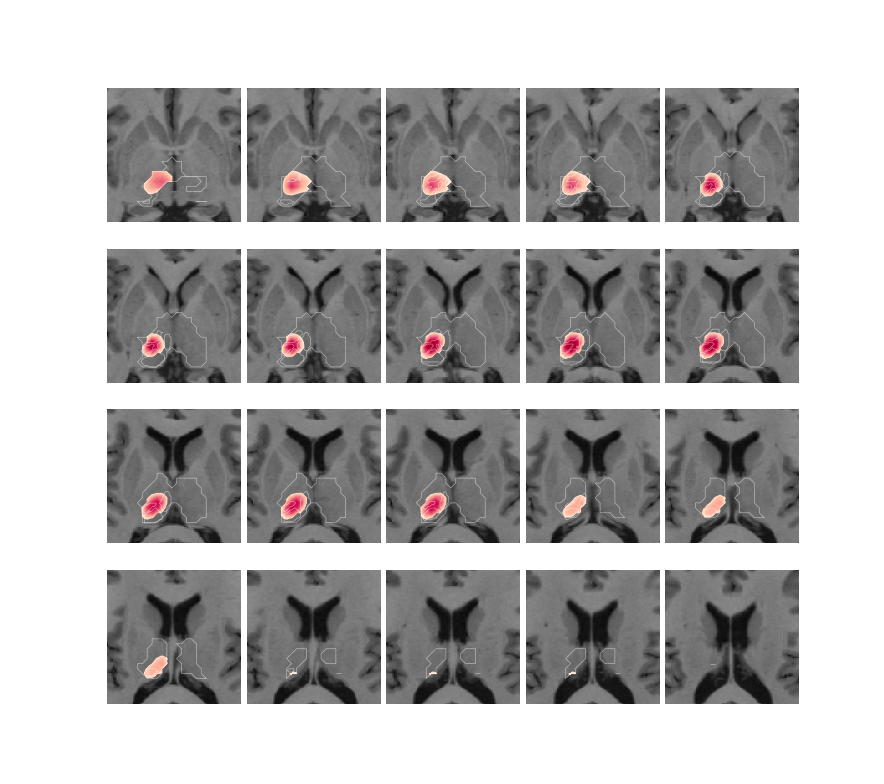

(48, 64, 48)
(48, 64, 48)


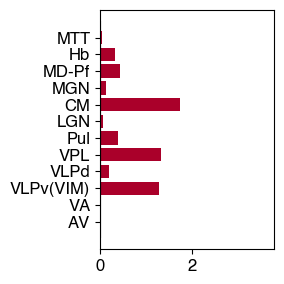

(48, 64, 48)
(48, 64, 48)


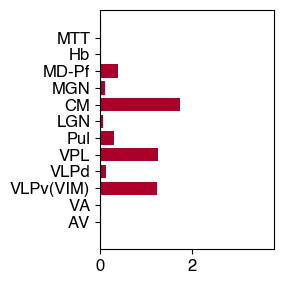

2.5760429108142837
0.8015931069850921
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] 4


/tmp/ipykernel_2274/171493490.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/pyt

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready
yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


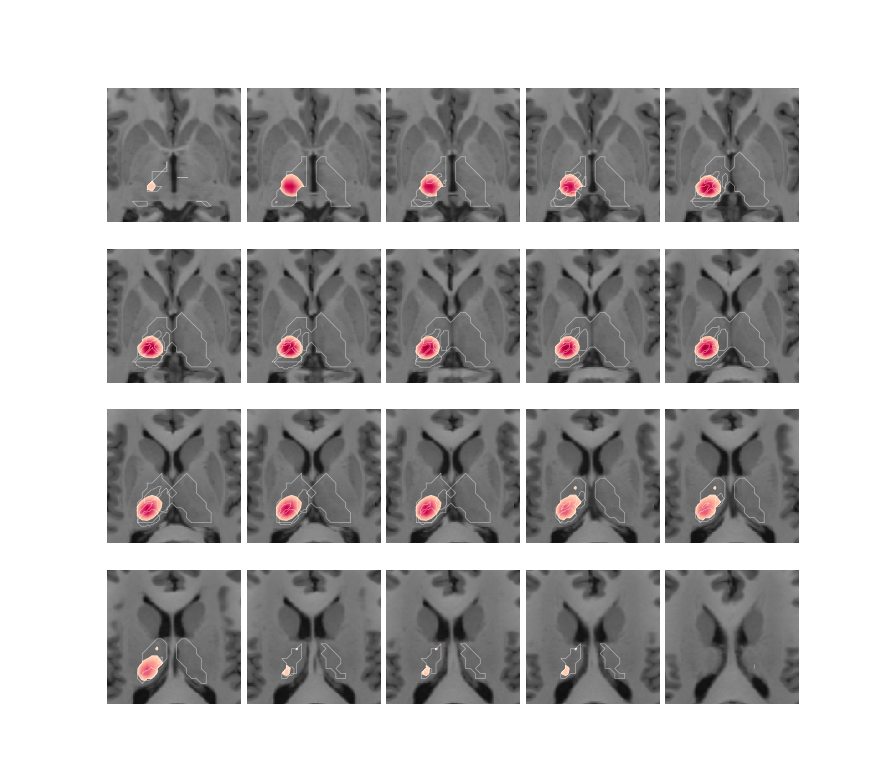

(48, 64, 48)
(48, 64, 48)


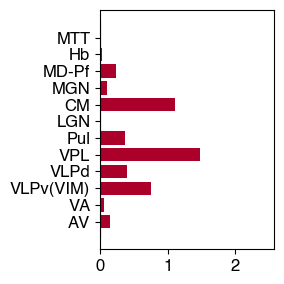

(48, 64, 48)
(48, 64, 48)


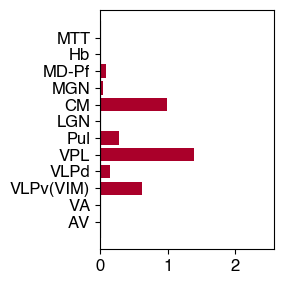

4.636872124671936
1.5865684747695923
[(1, 0.8112802768166091, 0.6947174163783161), (0.989442522106882, 0.6678892733564014, 0.5968473663975393), (0.9390772779700115, 0.4687043444828912, 0.5082660515186466), (0.8776239907727796, 0.21378700499807765, 0.4058439061899269), (0.8084044598231449, 0, 0.27563244905805456), (0.6707035755478662, 0, 0.1641061130334487)]
[-2 -1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] 4


/tmp/ipykernel_2274/171493490.py:34: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if valmni=='':
/tmp/ipykernel_2274/171493490.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if type(cut_coords)==int or cut_coords=='':
/tmp/ipykernel_2274/171493490.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if cut_coords!=(0,0,0):
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:438: UserWarning: empty mask
  xmin_, xmax_, ymin_, ymax_, zmin_, zmax_ = get_mask_bounds(
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/pyt

yes
raw 0 ready
yes
raw 1 ready
yes
raw 2 ready


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1454: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1455: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


yes
raw 3 ready


/tmp/ipykernel_2274/171493490.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outdir,dpi=300)
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


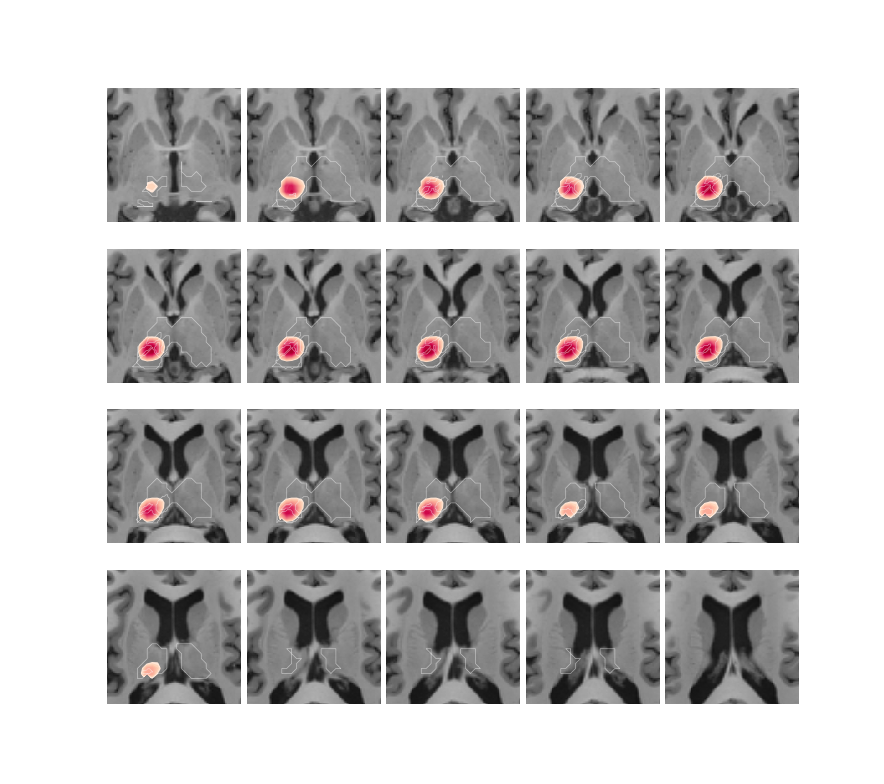

(48, 64, 48)
(48, 64, 48)


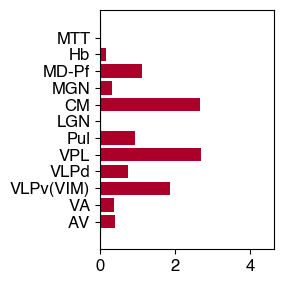

(48, 64, 48)
(48, 64, 48)


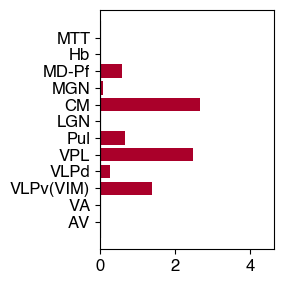

In [117]:
#plot thalamus , quand average per nuclei and average for top 20%
#R-L hand

T1path=[path+'/RosCha/Structurals/cast/bet/'+s+'/T1_masked.nii.gz' for s in sub]
colorlist=[['salsea',False]]#not using green do avoid confusion with overlap
for e,s in enumerate(sub):
    if e==0:
        pathorigall=[path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope6/tstat3_smooth6.0inverse.dtseries.nii'
        ]
    else:
        pathorigall=[path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope6/tstat3_smooth6.0inverse_333.dtseries.nii'
        ]
    taskname=['Right-LeftHandHCP']
    for n2,pathorig in enumerate(pathorigall):
        
        raw=nibabel.load(pathorig)
        axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
        # You'll want the brain model axis
        time_axis, brain_model_axis = axes
        data=raw.get_fdata()[0]
        data[np.where(data<0)]=0
        data[np.where(brain_model_axis.name!='CIFTI_STRUCTURE_THALAMUS_LEFT')]=0
        time_axis2=nibabel.cifti2.cifti2_axes.SeriesAxis(1,1,1)
        img=ci.Cifti2Image(np.array([data]), header=(time_axis2, brain_model_axis),
                    nifti_header=raw.nifti_header)
        ci.save(img,pathorig.replace('.dtseries.nii',('_POS_thalL.dtseries.nii')))
        pathorig=pathorig.replace('.dtseries.nii',('_POS_thalL.dtseries.nii'))

            
        raw=nibabel.load(pathorig)
        data=raw.get_fdata()[0]
        
        limmax=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT')],99.5)
        print(limmax)
        #thresh=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT')],80)
        thresh=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT')],70)
        print(thresh)
        
        mycmap=mycolorscale(colorlist[n2][0],limpos=limmax,limneg=-limmax,threshold=thresh,Ncolor=50,rev=colorlist[n2][1])
        color_listpos = [(mycmap(i)) for i in range(25,50)]#[::-1]
        color_listneg = [(mycmap(i)) for i in np.arange(24,-1,-1)]#[::-1]
        
        lim=[0,limmax]#limmaxall[e]]
        limpos=np.concatenate([[lim[0]],[(lim[1]-lim[0])*(i+1)/24+lim[0] for i in range(24)]],0)
        cutoff=np.where(limpos>=thresh)[0][0]
        limpos=limpos[cutoff:]
        color_listpos=color_listpos[cutoff:]
        color_listneg=color_listneg[cutoff:]
        #lim=[-limmaxall[e],0]
        limneg=limpos

        provlab=np.array([4, 6, 7, 10, 11] )
        net=path+'/RosCha/Structurals/cast/THOMAS/'+s+'thomasfull_T1.nii.gz'#path+'/RosCha/Structurals/cast/TRIO/'+s+'/ThalamicNuclei.v12.T1_on_TRIO_Y_NDC_222_BIN.nii.gz'
        
        plotvolindivThalamT1(pathorig,net,T1path[e],segselect=provlab,ortho='z',colorneg=color_listneg,thresholdneg=limneg,colorpos=color_listpos,thresholdpos=limpos,Zannotate=False,smoothing=0,savefig=path+'/RosCha/Results/figures/plasticitypulses/vol_'+s+'_'+taskname[n2]+'_tstats.pdf')#scale=5,space=None)
        testplotnucleiavg(s,pathorig,path+'/RosCha/Results/figures/plasticitypulses/bar_'+s+'_'+taskname[n2]+'_tstats.pdf',limmax,color_listpos[::-1][0])#,thresh)
        testplotnucleiavg(s,pathorig,path+'/RosCha/Results/figures/plasticitypulses/bar_'+s+'_'+taskname[n2]+'_tstats_thresh80.pdf',limmax,color_listpos[::-1][0],thresh)
    

In [262]:

#do quant per nuclei : pulse, fc, hand movement

#then the same for motor mouth Rhand Rfoot R-Lhand ("salsea") + nuclei average
T1path=[path+'/RosCha/Structurals/cast/bet/'+s+'/T1_masked.nii.gz' for s in sub]

for e,s in enumerate(sub):
    if e==0:
        pathorigall=[
                path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_amplitudeseries_during_tstats_smooth6.0.dtseries.nii',#second_level_cifti_during_pulse-6-HRF_LR_fix_nolearning/cifti_cope1/tstat1_smooth6.0.dtseries.nii',#path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_peakseries_statistics_smooth6.0.dtseries.nii',
                path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/cast-pre_tstats_LSM1.dtseries.nii',
                path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0.dtseries.nii'
            ]
    else:
        pathorigall=[
                path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_amplitudeseries_during_tstats_smooth6.0_333.dtseries.nii',#second_level_cifti_during_pulse-6-HRF_LR_fix_nolearning/cifti_cope1/tstat1_smooth6.0_333.dtseries.nii',#path+'/RosCha/Results/Tasks/rest/'+s+'/pulsemodel_Lsm1_peakseries_statistics_smooth6.0_333.dtseries.nii',
                path+'/RosCha/RestProcessing/cast/smooth255/'+s+'/FC/cast-pre_tstats_LSM1.dtseries.nii',
                path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope3/tstat3_smooth6.0_333.dtseries.nii'
            ]
    taskname=['pulse','fccastprelsm1','RightHandHCP']
    #keep=[]
    for n2,pathorig in enumerate(pathorigall):
        
        raw=nibabel.load(pathorig)
        axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
        # You'll want the brain model axis
        time_axis, brain_model_axis = axes
        data=raw.get_fdata()[0]
        data[np.where(data<0)]=0
        data[np.where(brain_model_axis.name!='CIFTI_STRUCTURE_THALAMUS_LEFT')]=0
        time_axis2=nibabel.cifti2.cifti2_axes.SeriesAxis(1,1,1)
        img=ci.Cifti2Image(np.array([data]), header=(time_axis2, brain_model_axis),
                    nifti_header=raw.nifti_header)
        ci.save(img,pathorig.replace('.dtseries.nii',('_POS_thalL.dtseries.nii')))
        pathorig=pathorig.replace('.dtseries.nii',('_POS_thalL.dtseries.nii'))

            
        raw=nibabel.load(pathorig)
        data=raw.get_fdata()[0]
        
        limmax=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT')],99.5)
        print(limmax)
        thresh=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT')],70)
        
        val,valnull=testMoranthalamicnuclei(s,pathorig,path+'/RosCha/Tools/Moran/'+s+'/dmat_cort_subcort',threshmethod='percentile',thresh=70)
        
        print(s,taskname[n2])
        print(val)
        save=np.array([len(np.where(valnull[i]-val[i]>0)[0])/1000 for i in range(12)])#[np.min([j,1-j]) for j in [len(np.where(valnull[i]-val[i]>0)[0])/1000 for i in range(12)]])
        test=fdr(save)# )np.where(val!=0)])
        print(test) #corrected
        save[np.where(val==0)]=np.nan
        
        print(save) #non corrected
        
    
        
    

12.493444418907163
9.534549713134766
(346,)
SIC01 pulse
[ 1.26872885  0.91633521  2.53421348  4.4596799   2.62414833  4.24158391
  3.36785968 10.78167868 12.17331791  2.76926314  3.21683121  0.        ]
[0.69490909 0.764      0.628      0.268      0.5595     0.3552
 0.246      0.072      0.054      0.55371429 0.568      0.7032    ]
[0.637 0.764 0.471 0.067 0.373 0.148 0.082 0.006 0.009 0.323 0.284   nan]
2.7279369592666614
0.2689005583524702
(346,)
SIC01 fccastprelsm1
[0.11219813 0.26180277 0.50041573 0.40964895 1.06049351 0.19506229
 0.05679661 0.         0.31813896 0.11961391 0.         0.83546783]
[0.74072727 0.9        0.78       0.717      0.         0.81
 0.90857143 0.892      0.936      0.786      0.8055     0.568     ]
[0.679 0.45  0.13  0.239 0.    0.675 0.53    nan 0.39  0.786   nan 0.142]
6.615514671802519
2.8588223457336426
(346,)
SIC01 RightHandHCP
[0.         0.         2.28879985 1.05228852 2.8276684  1.13341883
 0.         3.69377756 0.         1.48405078 0.         0. 

/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


(316,)
SIC03 pulse
[2.88906105 0.         5.17210751 1.960776   5.24834815 2.86203472
 0.         6.82399607 0.         6.38295949 0.         0.        ]
[0.516      0.863      0.528      0.654      0.402      0.582
 0.51085714 0.388      0.65127273 0.012      0.59333333 0.        ]
[0.344   nan 0.22  0.545 0.134 0.291   nan 0.097   nan 0.002   nan   nan]
9.90982370376587
5.390455722808838
(316,)
SIC03 fccastprelsm1
[1.38300034 0.         5.05471472 4.30342336 2.87352014 1.33998304
 0.         2.18971181 0.         2.81301803 0.         0.        ]
[0.657      0.9        0.204      0.222      0.54       0.6156
 0.556      0.58114286 0.65672727 0.4944     0.58933333 0.        ]
[0.438   nan 0.051 0.037 0.18  0.513   nan 0.339   nan 0.206   nan   nan]
6.036588275432588
2.1546988487243652
(316,)
SIC03 RightHandHCP
[0.         0.         1.75885593 0.79721482 2.82618885 1.20930957
 0.         3.52938461 0.         1.44547899 0.         0.        ]
[0.74509091 0.764      0.56571429 0.577333

In [119]:

#do quant per nuclei R-L hand motor task

#then the same for motor mouth Rhand Rfoot R-Lhand ("salsea") + nuclei average
T1path=[path+'/RosCha/Structurals/cast/bet/'+s+'/T1_masked.nii.gz' for s in sub]

for e,s in enumerate(sub):
    if e==0:
        pathorigall=[ path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope6/tstat3_smooth6.0inverse.dtseries.nii'
        ]
    else:
        pathorigall=[ path+'/RosCha/Results/Tasks/motor/'+s+'/second_level_cifti_precast_vs_postcast/cifti_cope6/tstat3_smooth6.0inverse_333.dtseries.nii'
        ]
    taskname=['Right-LeftHandHCP']
    #keep=[]
    for n2,pathorig in enumerate(pathorigall):
        
        raw=nibabel.load(pathorig)
        axes = [raw.header.get_axis(i) for i in range(raw.ndim)]
        # You'll want the brain model axis
        time_axis, brain_model_axis = axes
        data=raw.get_fdata()[0]
        data[np.where(data<0)]=0
        data[np.where(brain_model_axis.name!='CIFTI_STRUCTURE_THALAMUS_LEFT')]=0
        time_axis2=nibabel.cifti2.cifti2_axes.SeriesAxis(1,1,1)
        img=ci.Cifti2Image(np.array([data]), header=(time_axis2, brain_model_axis),
                    nifti_header=raw.nifti_header)
        ci.save(img,pathorig.replace('.dtseries.nii',('_POS_thalL.dtseries.nii')))
        pathorig=pathorig.replace('.dtseries.nii',('_POS_thalL.dtseries.nii'))

            
        raw=nibabel.load(pathorig)
        data=raw.get_fdata()[0]
        
        limmax=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT')],99.5)
        print(limmax)
        #thresh=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT')],80)
        thresh=np.percentile(data[np.where(brain_model_axis.name=='CIFTI_STRUCTURE_THALAMUS_LEFT')],70)
        
        val,valnull=testMoranthalamicnuclei(s,pathorig,path+'/RosCha/Tools/Moran/'+s+'/dmat_cort_subcort',threshmethod='percentile',thresh=70)
        
        print(s,taskname[n2])
        print(val)
        save=np.array([len(np.where(valnull[i]-val[i]>0)[0])/1000 for i in range(12)])#[np.min([j,1-j]) for j in [len(np.where(valnull[i]-val[i]>0)[0])/1000 for i in range(12)]])
        test=fdr(save)# )np.where(val!=0)])
        #save[np.where(val!=0)]=test
        print(test)
        save[np.where(val==0)]=np.nan
        #keep+=[save]
        print(save)
        
    #keep=np.reshape(np.array(keep),4*len(save))
    #test=fdr(keep[np.where(~np.isnan(keep))])
    #keep[np.where(~np.isnan(keep))]=test
    #print(np.reshape(keep,(4,len(save))))
        
    

3.7755157828330956
0.7214579284191125
(346,)
SIC01 Right-LeftHandHCP
[0.         0.         1.29419396 0.15611318 1.46084347 0.43322901
 0.39618524 1.73252656 0.46376877 0.47099128 0.         0.        ]
[0.8484     0.857      0.544      0.82581818 0.072      0.6915
 0.843      0.63       0.7728     0.658      0.78342857 0.7       ]
[  nan   nan 0.136 0.757 0.006 0.461 0.281 0.105 0.322 0.329   nan   nan]
2.5760429108142837
0.8015931069850921
(320,)
SIC02 Right-LeftHandHCP
[0.         0.         0.683237   0.19140453 1.44455941 0.46330856
 0.         0.99231237 0.16199408 0.1261521  0.         0.        ]
[0.7476     0.85854545 0.618      0.77466667 0.018      0.765
 0.         0.456      0.849      0.823      0.7272     0.86742857]
[  nan   nan 0.309 0.581 0.003 0.255   nan 0.114 0.566 0.823   nan   nan]
4.636872124671936
1.5865684747695923


/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/data/nil-bluearc/GMT/RosCha/Tools/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


(316,)
SIC03 Right-LeftHandHCP
[0.         0.         1.43611289 0.34378355 2.57900059 0.93501375
 0.         2.66342908 0.35494652 0.74827354 0.         0.        ]
[0.71890909 0.747      0.52971429 0.7656     0.09       0.5784
 0.616      0.144      0.648      0.678      0.597      0.        ]
[  nan   nan 0.309 0.638 0.015 0.241   nan 0.036 0.486 0.226   nan   nan]
